# Regression Kriging: Comparing Covariates (Big Bend)

This document includes Python codes that compare regression kriging with 1) bathymatry, 2) LDI, 3) basymatry+ LDI.

All date are shared in the [box folder](https://usf.box.com/s/xu3dw4i1emv2hzveyf9idnx9q78t939c).

# Table of Contents:

* [1.Load Data](#load_data)
* [2. Combine Discrete and Continuous Data](#preprocess)
* [3. Big Bend](#ch)
    * [3.1 Preview](#ch_preview)
    * [3.2 Dissolved Oxygen](#do)
        * [3.2.1 Regression Kriging (covariate: bathymetry](#do_bathy)
        * [3.2.2 Regression Kriging: (covariate: LDI)](#do_ldi)
        * [3.2.3 Regression Kriging: (covariate: PopDen)](#do_pd)
        * [3.2.4 Regression Kriging: (covariate: Water Flow)](#do_wf)
        * [3.2.5 Regression Kriging (covariate: bathymetry+LDI](#do_ldi_bathy)
        * [3.2.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#do_ldi_bathy_wf) 
        * [3.2.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#do_ldi_bathy_pd) 
        * [3.2.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#do_ldi_bathy_pd_wf) 
        * [3.2.9 Interpolation Validation](#do_val_sum)
    * [3.3 Salinity](#s)
        * [3.3.1 Regression Kriging (covariate: bathymetry](#s_bathy)
        * [3.3.2 Regression Kriging: (covariate: LDI)](#s_ldi)
        * [3.3.3 Regression Kriging (covariate: bathymetry+LDI](#s_ldi_bathy)
        * [3.3.3 Regression Kriging: (covariate: PopDen)](#s_pd)
        * [3.3.4 Regression Kriging: (covariate: Water Flow)](#s_wf)
        * [3.3.5 Regression Kriging (covariate: bathymetry+LDI](#s_ldi_bathy)
        * [3.3.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#s_ldi_bathy_wf) 
        * [3.3.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#s_ldi_bathy_pd) 
        * [3.3.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#s_ldi_bathy_pd_wf) 
        * [3.3.9 Interpolation Validation](#s_val_sum)
    * [3.4 Total Nitrogen](#tn)
        * [3.4.1 Regression Kriging (covariate: bathymetry](#tn_bathy)
        * [3.4.2 Regression Kriging: (covariate: LDI)](#tn_ldi)
        * [3.4.3 Regression Kriging (covariate: bathymetry+LDI](#tn_ldi_bathy)
        * [3.4.3 Regression Kriging: (covariate: PopDen)](#tn_pd)
        * [3.4.4 Regression Kriging: (covariate: Water Flow)](#tn_wf)
        * [3.4.5 Regression Kriging (covariate: bathymetry+LDI](#tn_ldi_bathy)
        * [3.4.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#tn_ldi_bathy_wf) 
        * [3.4.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#tn_ldi_bathy_pd) 
        * [3.4.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#tn_ldi_bathy_pd_wf) 
        * [3.4.9 Interpolation Validation](#tn_val_sum)
    * [3.5 Turbidity](#t)
        * [3.5.1 Regression Kriging (covariate: bathymetry](#t_bathy)
        * [3.5.2 Regression Kriging: (covariate: LDI)](#t_ldi)
        * [3.5.3 Regression Kriging (covariate: bathymetry+LDI](#t_ldi_bathy)
        * [3.5.3 Regression Kriging: (covariate: PopDen)](#t_pd)
        * [3.5.4 Regression Kriging: (covariate: Water Flow)](#t_wf)
        * [3.5.5 Regression Kriging (covariate: bathymetry+LDI](#t_ldi_bathy)
        * [3.5.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#t_ldi_bathy_wf) 
        * [3.5.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#t_ldi_bathy_pd) 
        * [3.5.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#t_ldi_bathy_pd_wf) 
        * [3.5.9 Interpolation Validation](#t_val_sum)
    * [3.6 Secchi Depth](#sd)
        * [3.6.1 Regression Kriging (covariate: bathymetry](#sd_bathy)
        * [3.6.2 Regression Kriging: (covariate: LDI)](#sd_ldi)
        * [3.6.3 Regression Kriging (covariate: bathymetry+LDI](#sd_ldi_bathy)
        * [3.6.3 Regression Kriging: (covariate: PopDen)](#sd_pd)
        * [3.6.4 Regression Kriging: (covariate: Water Flow)](#sd_wf)
        * [3.6.5 Regression Kriging (covariate: bathymetry+LDI](#sd_ldi_bathy)
        * [3.6.6 Regression Kriging (covariate: bathymetry+LDI+Water Flow](#sd_ldi_bathy_wf) 
        * [3.6.7 Regression Kriging (covariate: bathymetry+LDI+ Population Density](#sd_ldi_bathy_pd) 
        * [3.6.8 Regression Kriging (covariate: bathymetry+LDI+ Population Density + Water Flow](#sd_ldi_bathy_pd_wf) 
        * [3.6.9 Interpolation Validation](#sd_val_sum)

In [1]:
import time, math, os, importlib
import sklearn.metrics  
import arcgisscripting
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio as rio
import rasterio.mask
import rasterio.plot as rio_pl
import matplotlib.image as mpimg

from rasterio.plot import show
from rasterio.transform import Affine
from rasterio.mask import mask
from rasterio import MemoryFile
from rasterio.profiles import DefaultGTiffProfile
from scipy.spatial import Voronoi, voronoi_plot_2d
from scipy.stats import sem
from sklearn.metrics import mean_squared_error
from shapely.geometry import box, Polygon, Point
from shapely import wkt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
import contextily as cx

import arcpy
from arcpy.sa import *
import misc.preprocess
import misc.interpolation
arcpy.env.overwriteOutput = True

# 1. Load and Preprocess Data <a class="anchor" id="load_data"></a>

In [2]:
path = "E:/Projects/SEACAR_WQ_Pilot/"
gis_path = path+'GIS_data/'

# path = "D:/Water_Quailty/"
# gis_path = path+'Test02200/'

Preprocess the data and save the preprocessed data in new files

In [3]:
# dfDis, dfCon = misc.preprocess.preprocess(path + r"OEAT_Discrete-2023-Jan-23.csv", 
#                     path + r"OEAT_Continuous_1-2023-Jan-23.csv",
#                     path + r"OEAT_Continuous_2-2023-Jan-23.csv")

# dfDis.to_csv(path + "discrete_0214.csv")
# dfCon.to_csv(path + "continuous_0214.csv")

To save time, we can load the preprocessed "discrete_0214.csv" and "continuous_0214.csv".

In [4]:
#dfDis = pd.read_csv("D:/Water_Quailty/Test0214/discrete_0214.csv")
#dfCon = pd.read_csv("D:/Water_Quailty/Test0214/continuous_0214.csv")

dfDis = pd.read_csv(path + "discrete_0214.csv")
dfCon = pd.read_csv(path + "continuous_0214.csv")

C:\Users\qiangy\AppData\Local\ESRI\conda\envs\geo3\lib\site-packages\IPython\core\interactiveshell.py:3442: DtypeWarning: Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [5]:
col_ls = ['RowID','ParameterName','ParameterUnits','ProgramLocationID','ActivityType','ManagedAreaName',
                   'SampleDate','Year','Month','ResultValue','ValueQualifier','Latitude_DD','Longitude_DD']
para_ls = ["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth"]
para_ls_ab = ["S","TN","DO","T","SD"]
# Convert full MA names to short names
dictArea    = {'Gasparilla Sound-Charlotte Harbor Aquatic Preserve':'Charlotte Harbor','Big Bend Seagrasses Aquatic Preserve':'Big Bend',
                'Guana Tolomato Matanzas National Estuarine Research Reserve':'GTM Reserve','Estero Bay Aquatic Preserve':'Estero Bay',
                'Biscayne Bay Aquatic Preserve':'Biscayne Bay','Matlacha Pass Aquatic Preserve':'Matlacha Pass AP',
                'Lemon Bay Aquatic Preserve':'Lemon Bay','Cape Haze Aquatic Preserve':'Cape Haze','Pine Island Sound Aquatic Preserve':'Pine Island'}

# Convert full MA names to MA name in ORCP_Managed_Areas_Oct2021
dictArea2    = {'Gasparilla Sound-Charlotte Harbor Aquatic Preserve':'Gasparilla Sound-Charlotte Harbor','Big Bend Seagrasses Aquatic Preserve':'Big Bend Seagrasses',
                'Guana Tolomato Matanzas National Estuarine Research Reserve':'Guana Tolomato Matanzas NERR','Estero Bay Aquatic Preserve':'Estero Bay',
                'Biscayne Bay Aquatic Preserve':'Biscayne Bay','Matlacha Pass Aquatic Preserve':'Matlacha Pass',
                'Lemon Bay Aquatic Preserve':'Lemon Bay','Cape Haze Aquatic Preserve':'Cape Haze','Pine Island Sound Aquatic Preserve':'Pine Island Sound'}

dictUnits   = {"Salinity":"ppt","Total Nitrogen": "mg/L","Dissolved Oxygen": "mg/L","Turbidity": "NTU", "Secchi Depth": "m"}
listArea    = dfCon["ManagedAreaName"].unique()
listPara    = ["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth"] 

# 2. Combine Discrete and Continuous Data <a class="anchor" id="combine"></a>

Combine dis and con dataframes

In [6]:
#Select managed area
Area = 'Big Bend Seagrasses Aquatic Preserve'

# Set variables of the program
year = "2016"
Para = 'Dissolved Oxygen'
Para_ab = "DO"
SpatialRef = '3086'
b_name = 'ch'

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'
boundary_shp = gis_path+ '{}.shp'.format(b_name)

# ---------------------------- Uncomment in the first run --------------------------
dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\2541980180.py:25: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\2541980180.py:26: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Skip the preprocessing and load the pre-stored dataframes

In [7]:
# gdfDryAll = pd.read_csv(gis_path+'gdfDryAll{}.csv'.format(year))
# gdfDryAll = gdfDryAll['geometry'].apply(wkt.loads)
# gdfDryAll = gpd.GeoDataFrame(gdfDryAll, crs='epsg:'+SpatialRef)

# gdfWetAll = pd.read_csv(gis_path+'gdfWetAll{}.csv'.format(year))
# gdfWetAll = gdfWetAll['geometry'].apply(wkt.loads)
# gdfWetAll = gpd.GeoDataFrame(gdfWetAll, crs='epsg:'+SpatialRef)

# 3. Big Bend <a class="anchor" id="ch"></a>
## 3.1 Preview Data <a class="anchor" id="ch_preview"></a>

In [8]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

ma_table = pd.read_csv(gis_path + "MA_table.csv")

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [9]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Big Bend Seagrasses Aquatic Preserve')

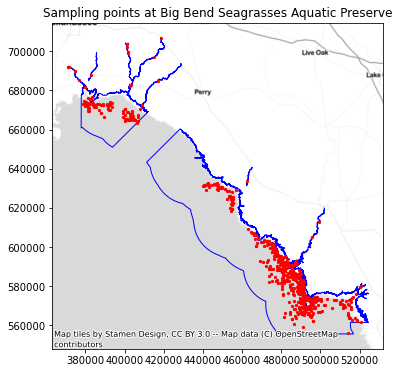

In [10]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

## 3.2 Dissolved Oxygen <a class="anchor" id="do"></a>

### 3.2.1 Regression Kriging (covariate: bathymetry) <a class="anchor" id="do_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

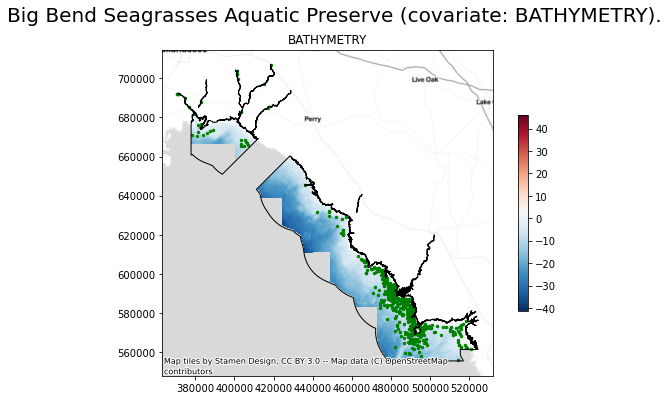

In [11]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate.upper(), ax, fig)

RK interpolation

In [12]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 2133.905169725418 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2457.998290538788 seconds ---


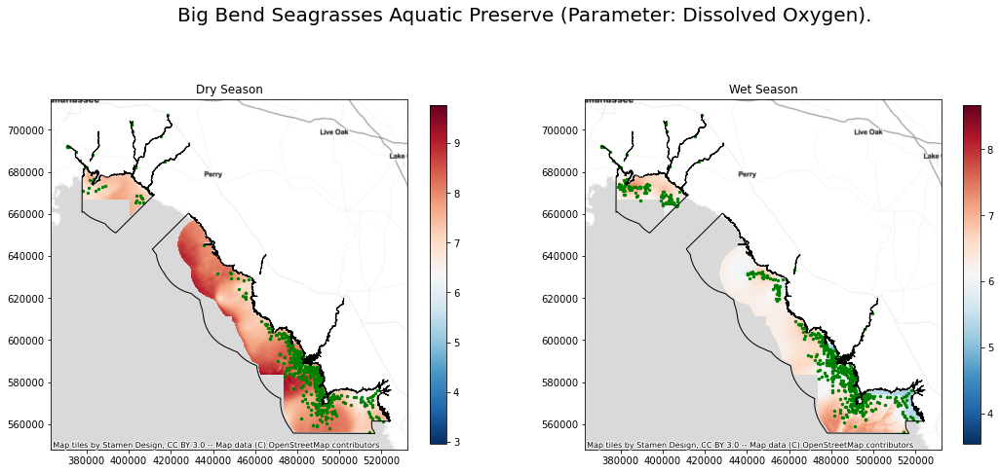

In [13]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.2.2 Regression Kriging (covariate: LDI) <a class="anchor" id="do_ldi"></a>


RK interpolation

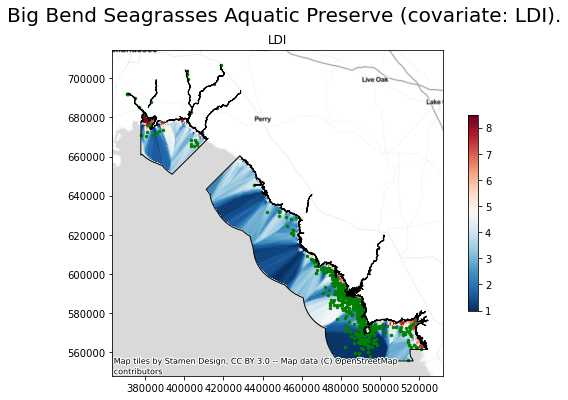

In [14]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [15]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 2280.0275795459747 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2780.9343252182007 seconds ---


Plot the interpolation result

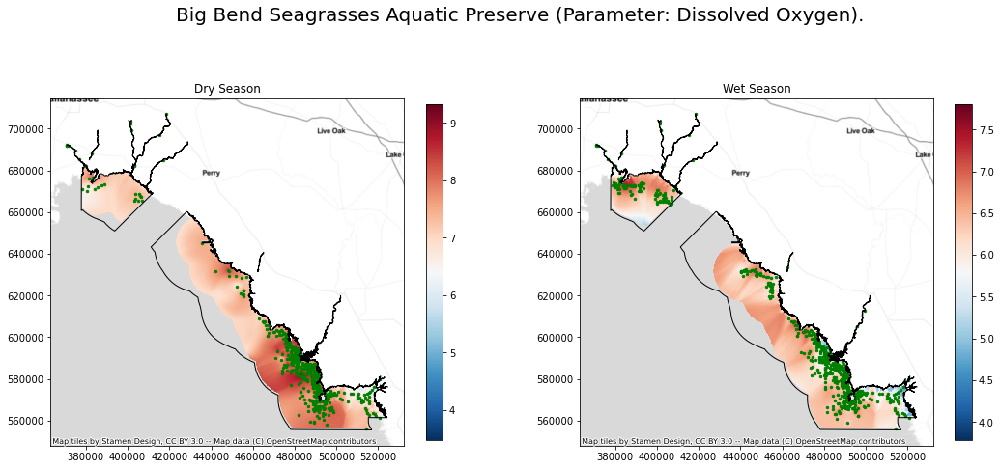

In [16]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.2.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="do_pd"></a>


RK interpolation

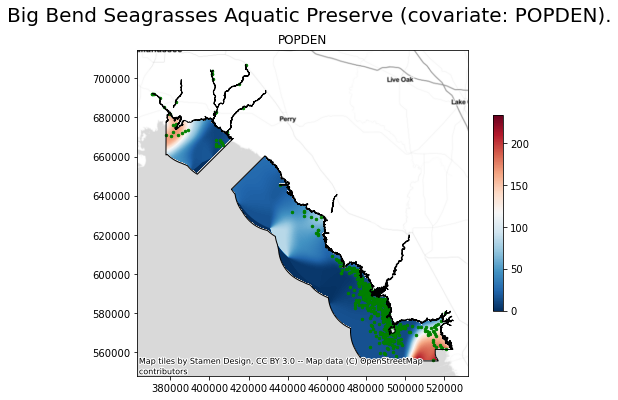

In [17]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [18]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 2295.776043653488 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2725.829526424408 seconds ---


Plot the interpolation result

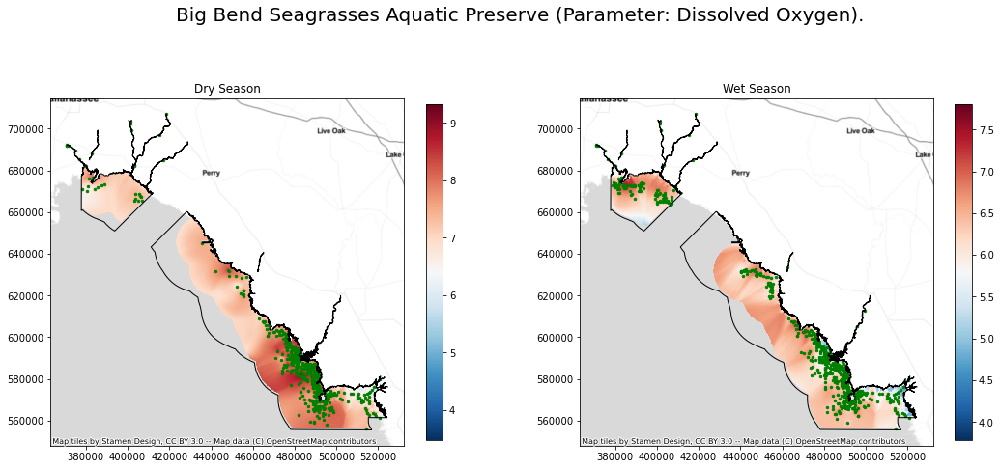

In [19]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.2.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="do_wf"></a>

RK interpolation

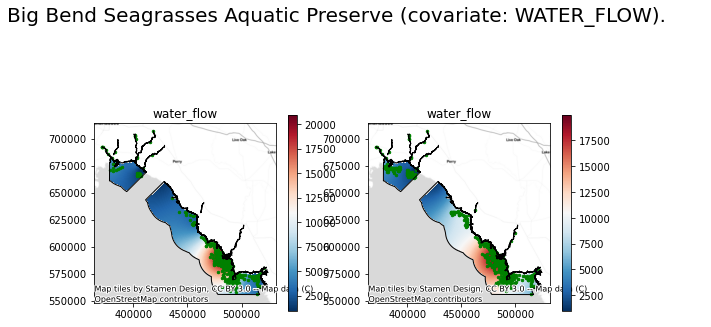

In [20]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [21]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 2288.0028009414673 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2676.3488535881042 seconds ---


Plot the interpolation result

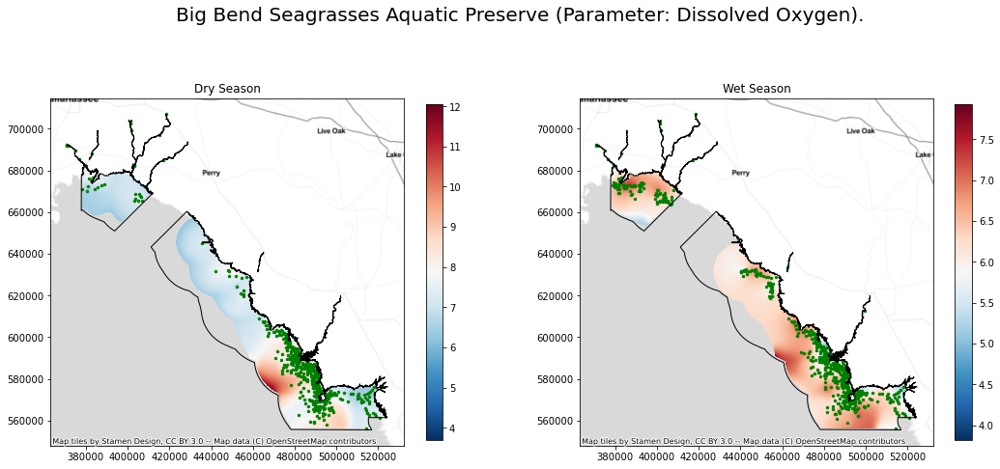

In [22]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.2.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="do_ldi_bathy"></a>


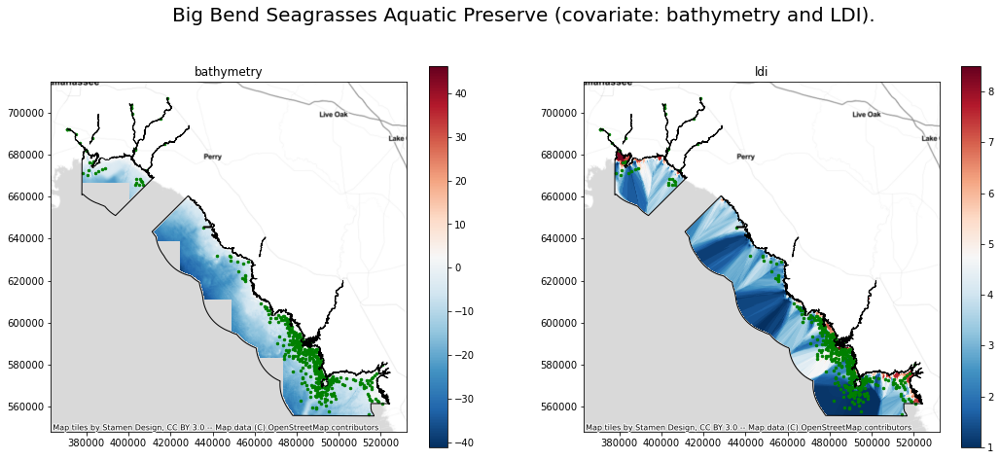

In [23]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [24]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 3703.117268562317 seconds ---
Start the interpolation with the RK method
--- Time lapse: 4274.664868354797 seconds ---


Plot interpolation results

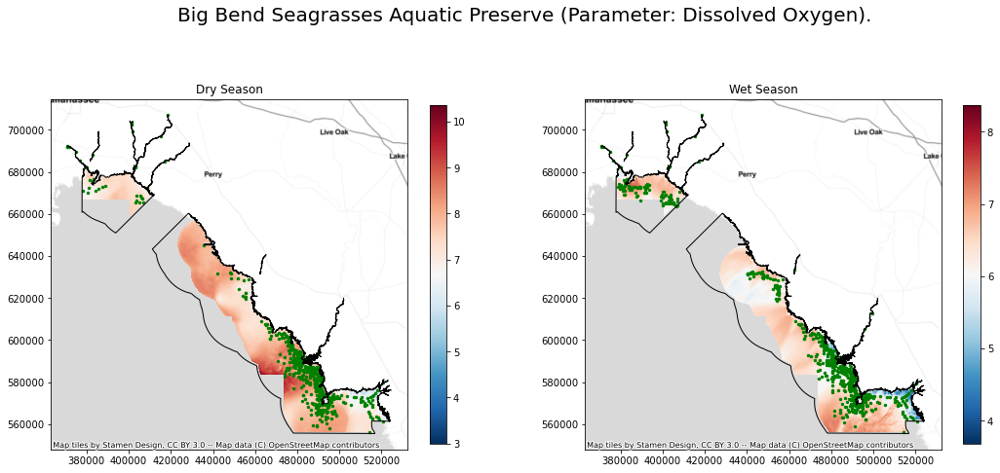

In [25]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.2.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="do_ldi_bathy_wf"></a>


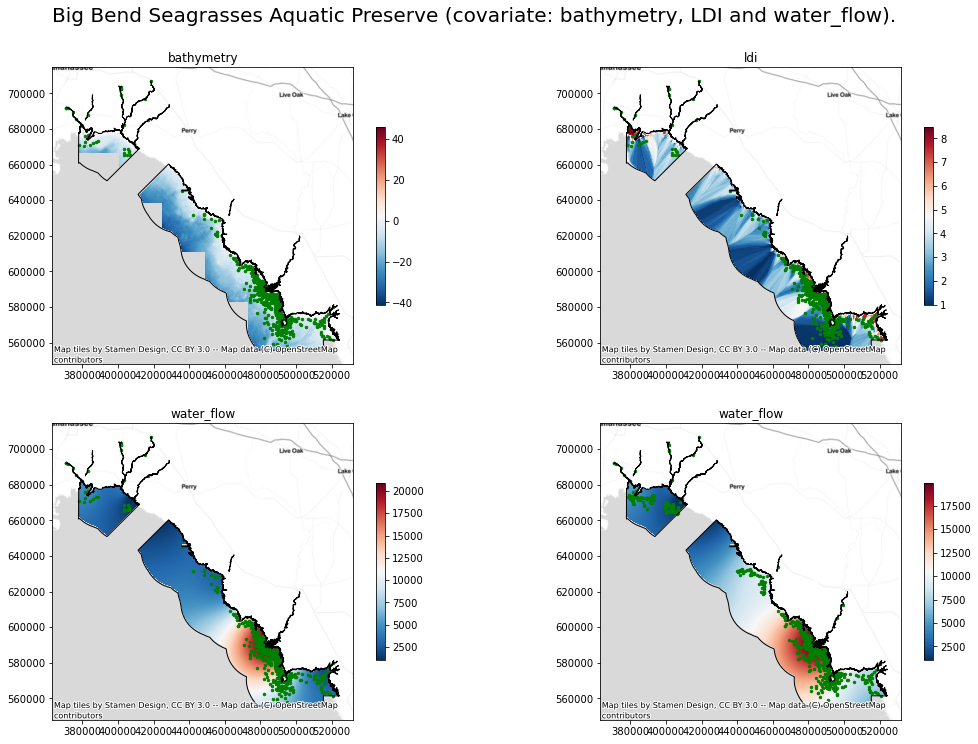

In [26]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [27]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 5259.627841949463 seconds ---
Start the interpolation with the RK method
--- Time lapse: 6045.593653917313 seconds ---


Plot interpolation results

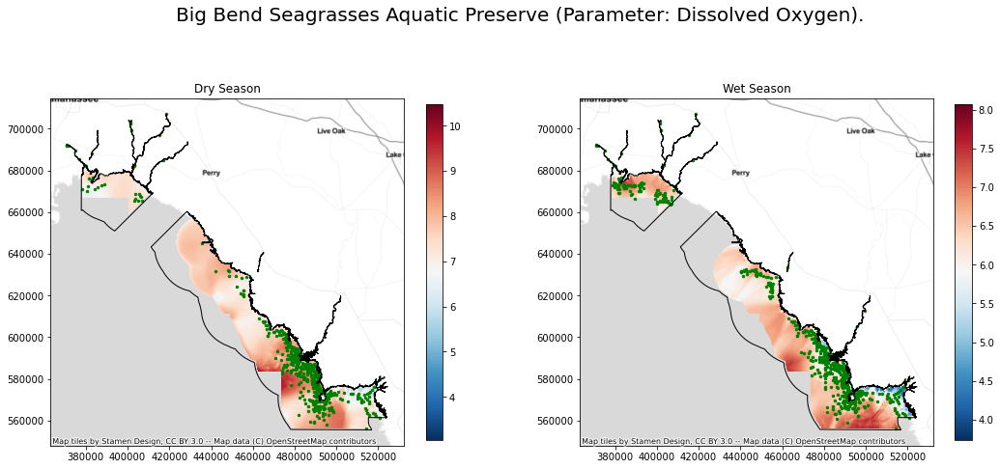

In [28]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.2.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="do_ldi_bathy_pd"></a>


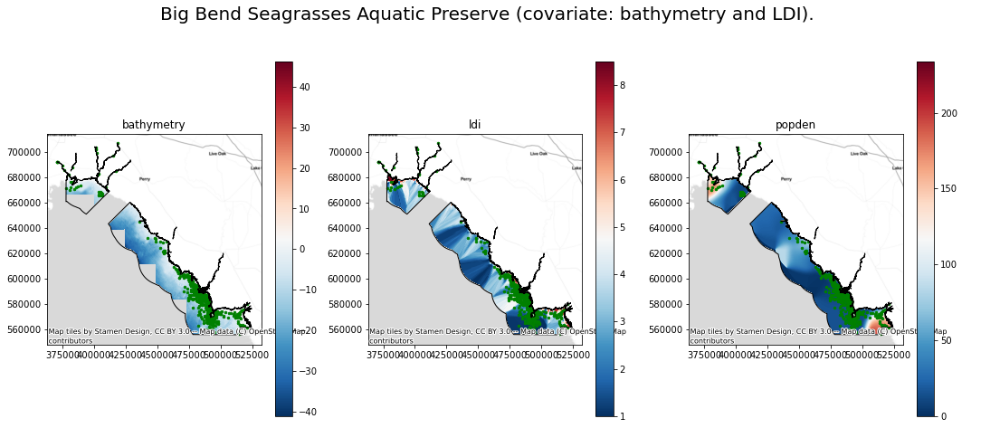

In [29]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [30]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 6181.628924846649 seconds ---
Start the interpolation with the RK method
--- Time lapse: 6241.65579867363 seconds ---


Plot interpolation results

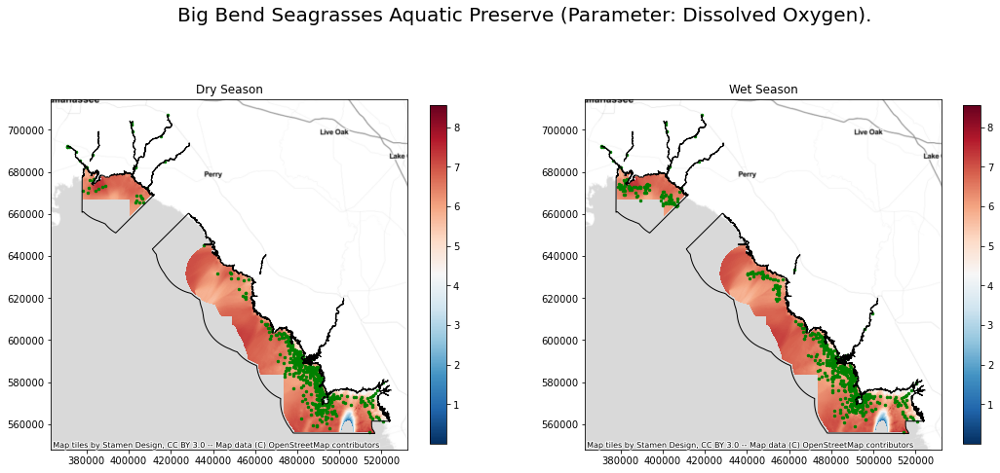

In [31]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.2.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="do_ldi_bathy_pd_wf"></a>


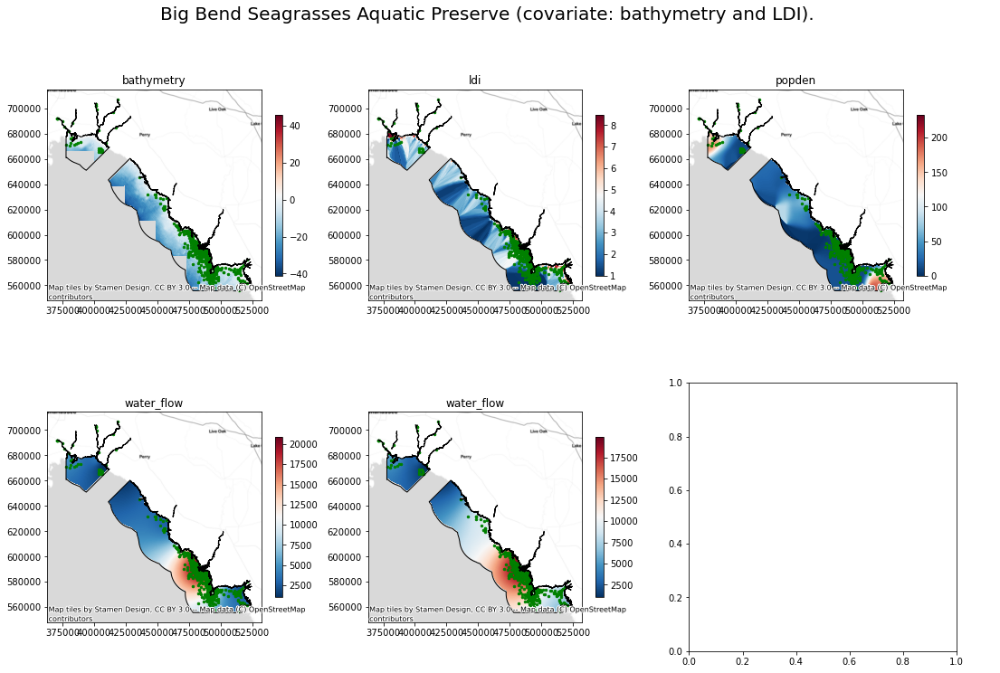

In [32]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [33]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 8057.221479892731 seconds ---
Start the interpolation with the RK method
--- Time lapse: 7989.589375734329 seconds ---


Plot interpolation results

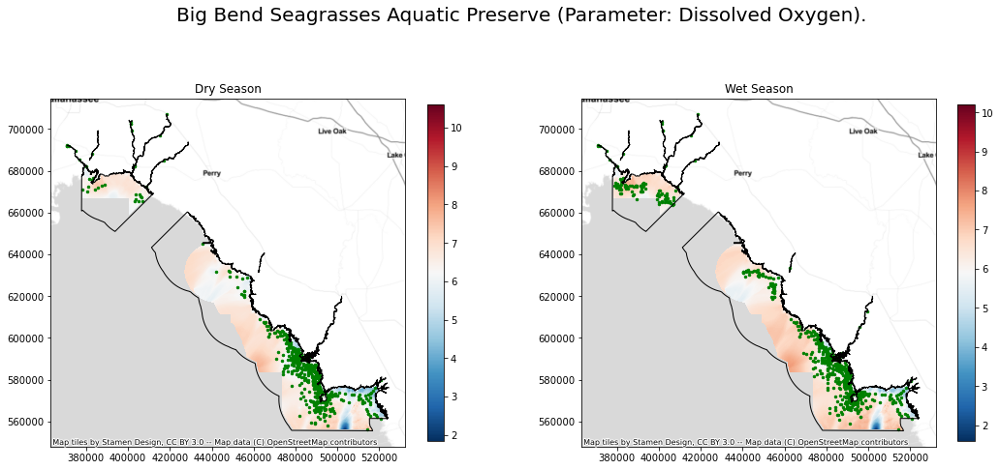

In [34]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.2.9 Validation Summary <a class="anchor" id="do_val_sum"></a>

In [35]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.0241,0.0149,1.6349
RK,0.0158,0.0092,1.6407
RK,0.0118,0.0081,1.6426
RK,0.0272,0.0134,1.6400
RK,0.0208,0.0118,1.6293
RK,0.0259,0.0133,1.6274
RK,0.0138,0.0155,1.2515
RK,0.0140,0.0154,1.2504


In [36]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.0135,0.0156,1.2627
RK,0.0022,0.0068,1.2572
RK,0.0058,0.0102,1.2568
RK,0.0231,0.0214,1.2585
RK,0.0142,0.0147,1.2556
RK,0.0118,0.0112,1.2516
RK,0.0138,0.0155,1.2515
RK,0.0157,0.0157,1.2489


## 3.3 Interpolation of Salinity <a class="anchor" id="s"></a>

Select salinity data

In [37]:
# Set variables of the program
Para = 'Salinity'
Para_ab = "S"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

# ---------------------------- Uncomment in the first run --------------------------

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\1647803667.py:13: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\1647803667.py:14: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


In [38]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)

Text(0.5, 1.0, 'Sampling points at Big Bend Seagrasses Aquatic Preserve')

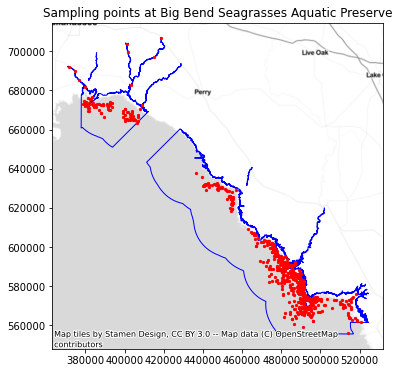

In [39]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.3.1 Regression Kriging of Salinity (covariate: bathymetry) <a class="anchor" id="s_bathy"></a>

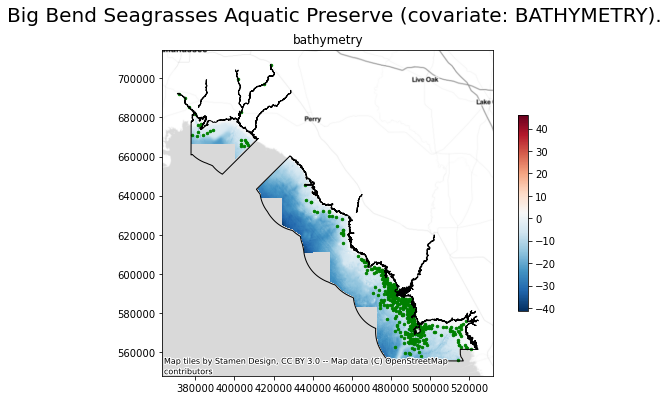

In [40]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [41]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 2389.1971797943115 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2766.323402404785 seconds ---


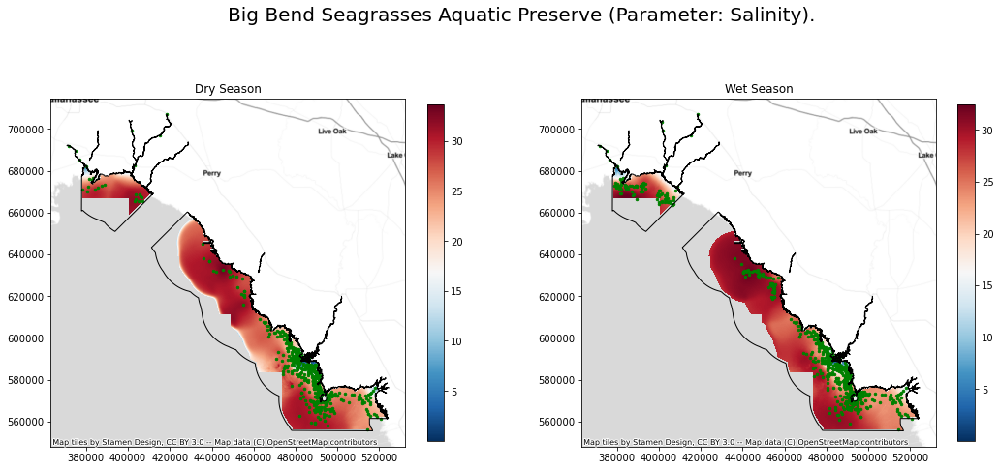

In [42]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.3.2 Regression Kriging (covariate: LDI) <a class="anchor" id="s_ldi"></a>


RK interpolation

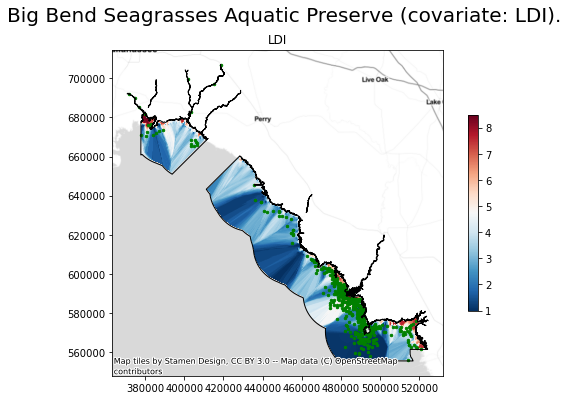

In [43]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [44]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1899.8208017349243 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2386.223113298416 seconds ---


Plot the interpolation result

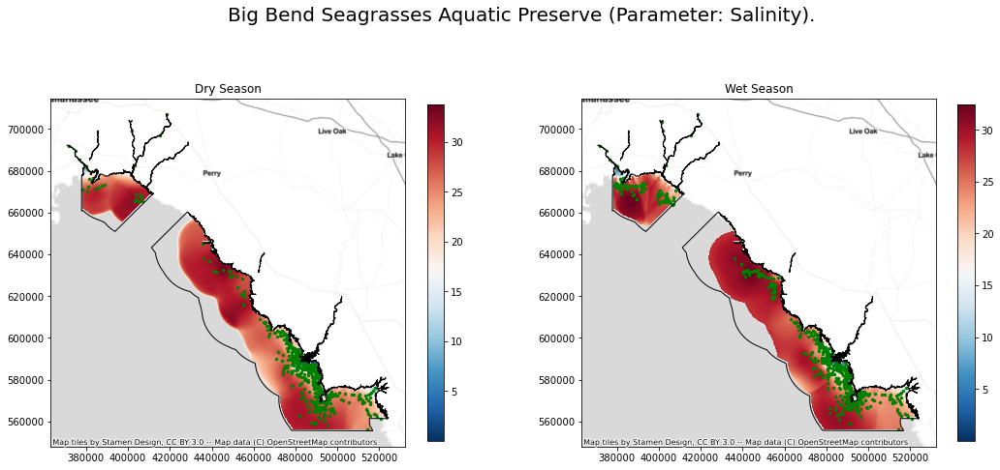

In [45]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.3.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="s_pd"></a>


RK interpolation

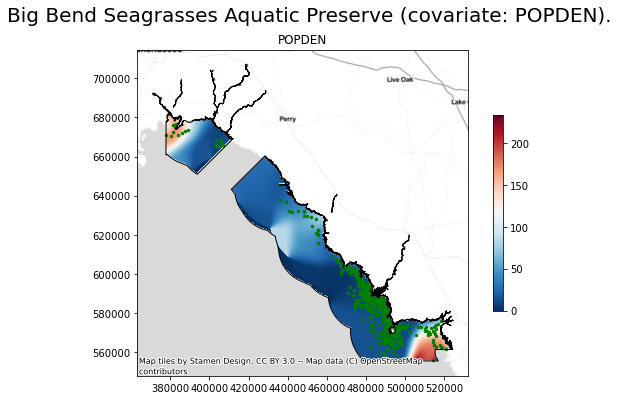

In [46]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [47]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1871.5334067344666 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2243.204914331436 seconds ---


Plot the interpolation result

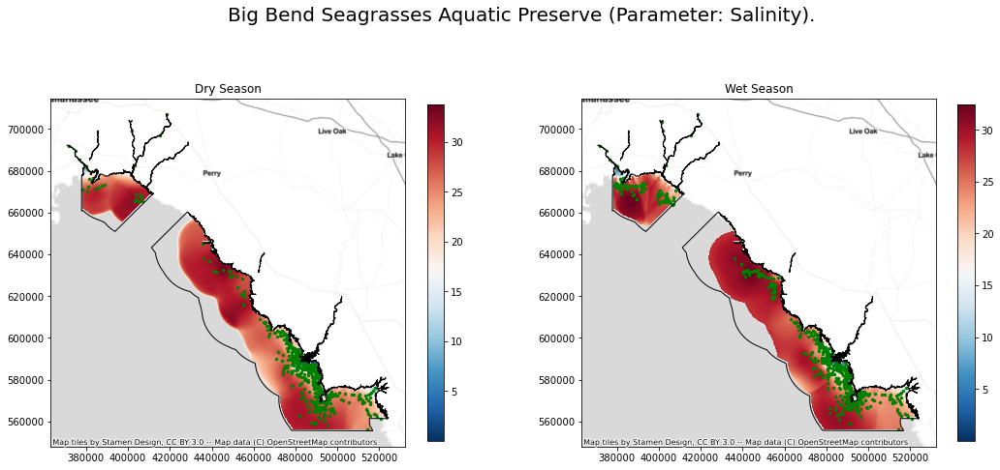

In [48]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.3.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="s_wf"></a>

RK interpolation

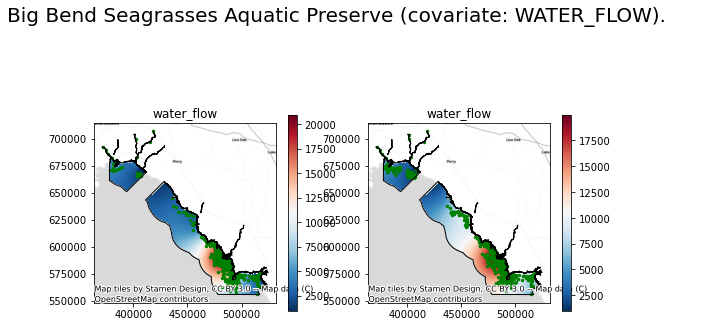

In [49]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [50]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1941.0533163547516 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2522.2803535461426 seconds ---


Plot the interpolation result

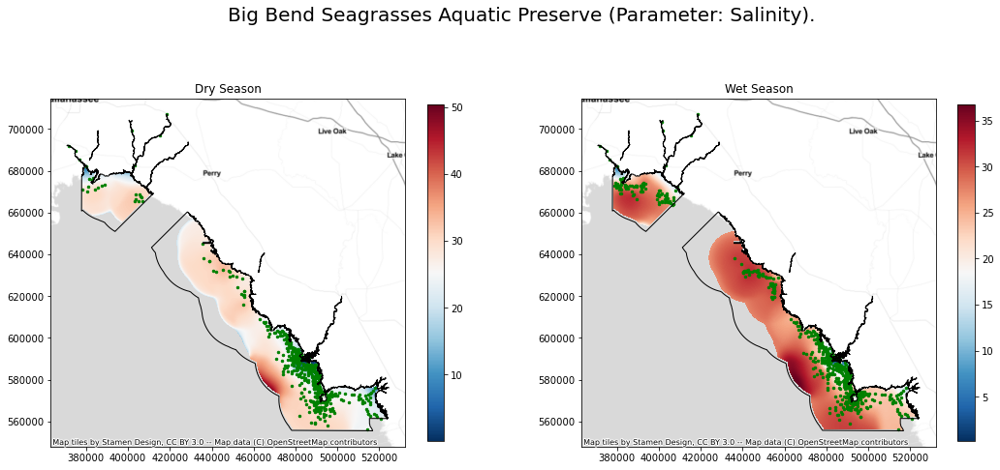

In [51]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.3.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="s_ldi_bathy"></a>


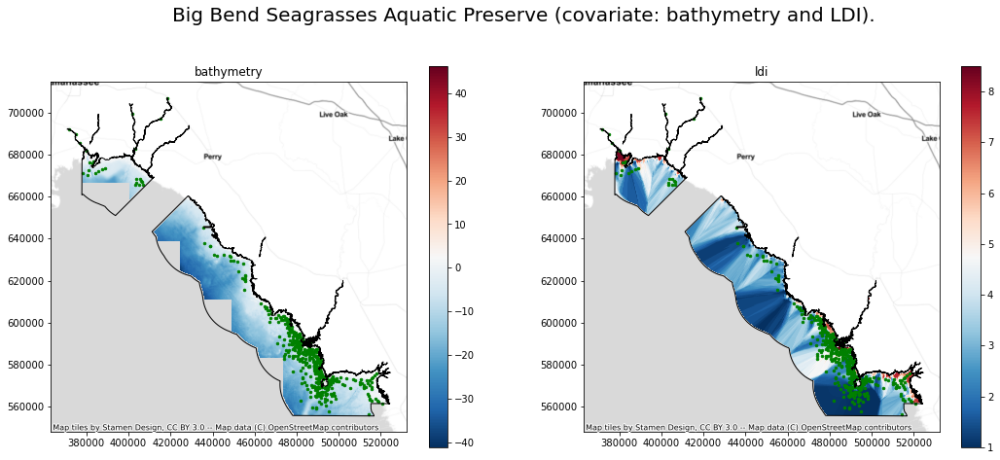

In [52]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [53]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 3122.4173176288605 seconds ---
Start the interpolation with the RK method
--- Time lapse: 32.32257318496704 seconds ---


Plot interpolation results

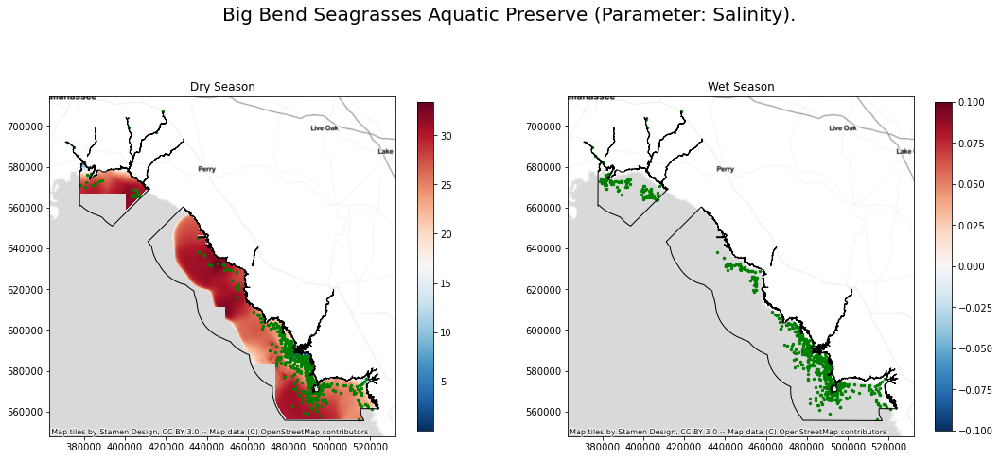

In [54]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.3.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="s_ldi_bathy_wf"></a>


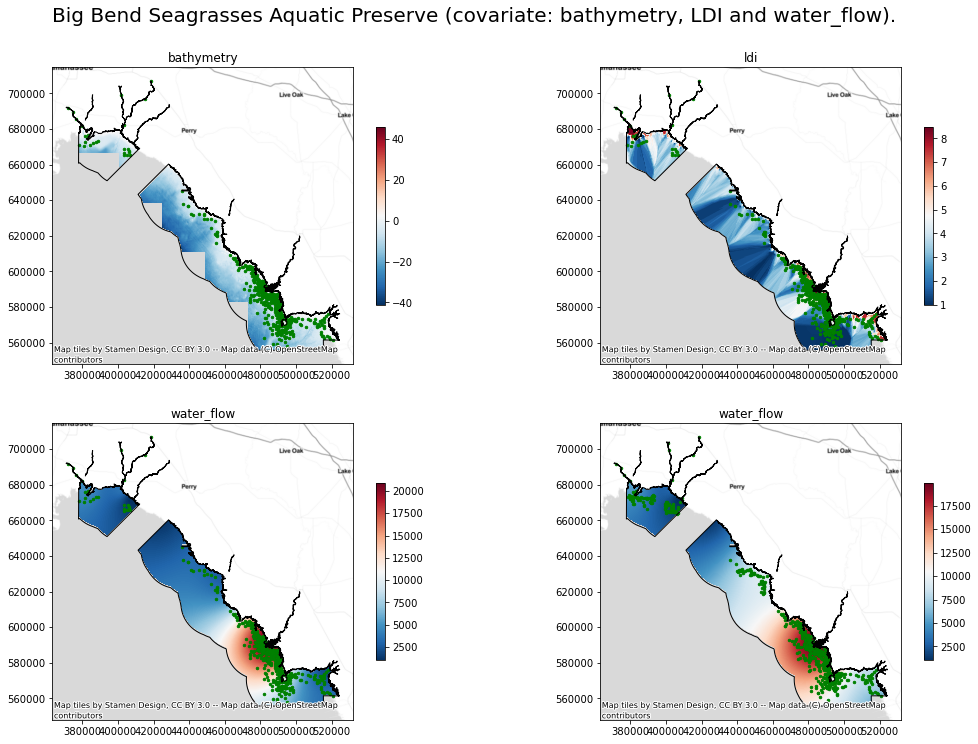

In [55]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [56]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 48.63410758972168 seconds ---
Start the interpolation with the RK method
--- Time lapse: 47.680651903152466 seconds ---


Plot interpolation results

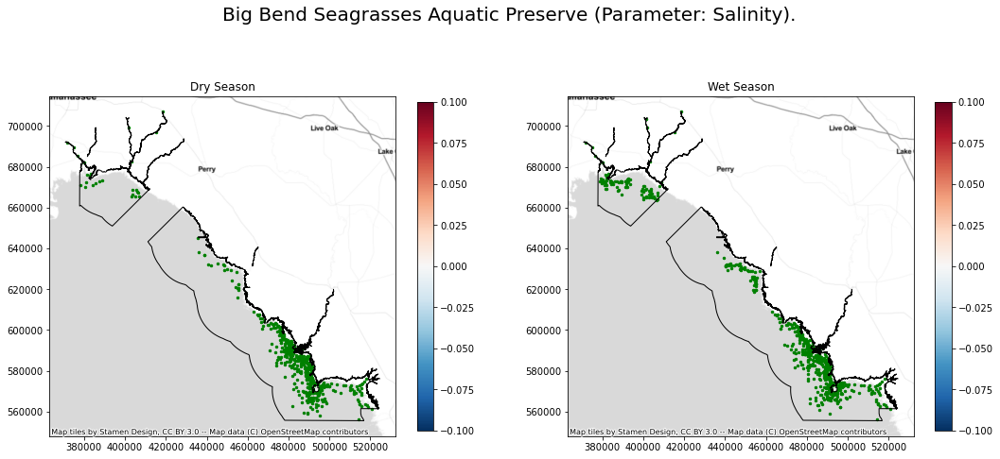

In [57]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.3.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="s_ldi_bathy_pd"></a>


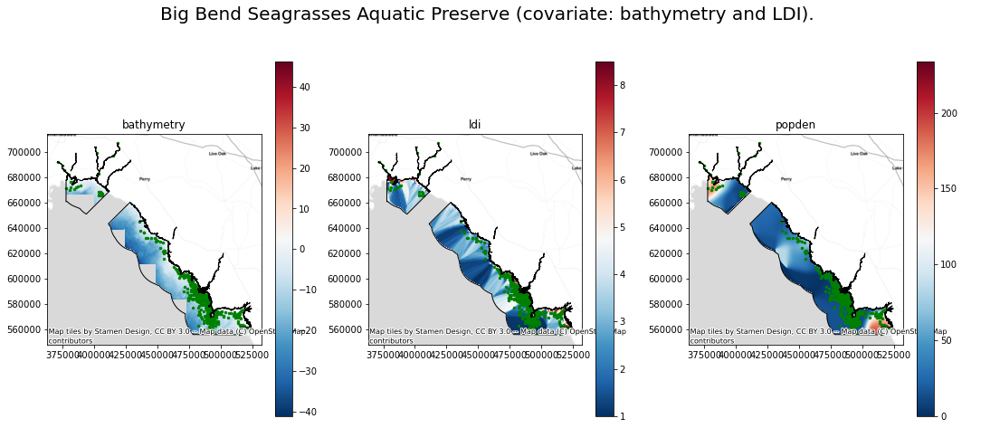

In [58]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [59]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 47.512102127075195 seconds ---
Start the interpolation with the RK method
--- Time lapse: 46.37114763259888 seconds ---


Plot interpolation results

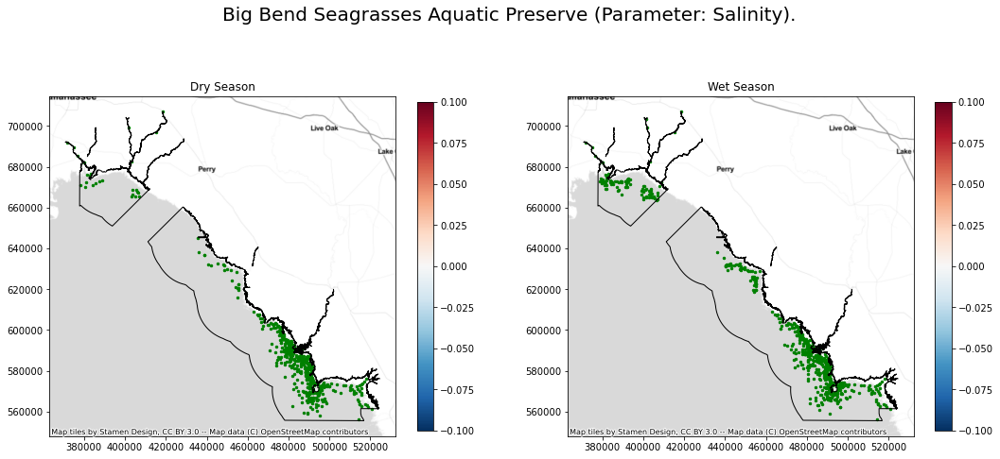

In [60]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.3.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="s_ldi_bathy_pd_wf"></a>


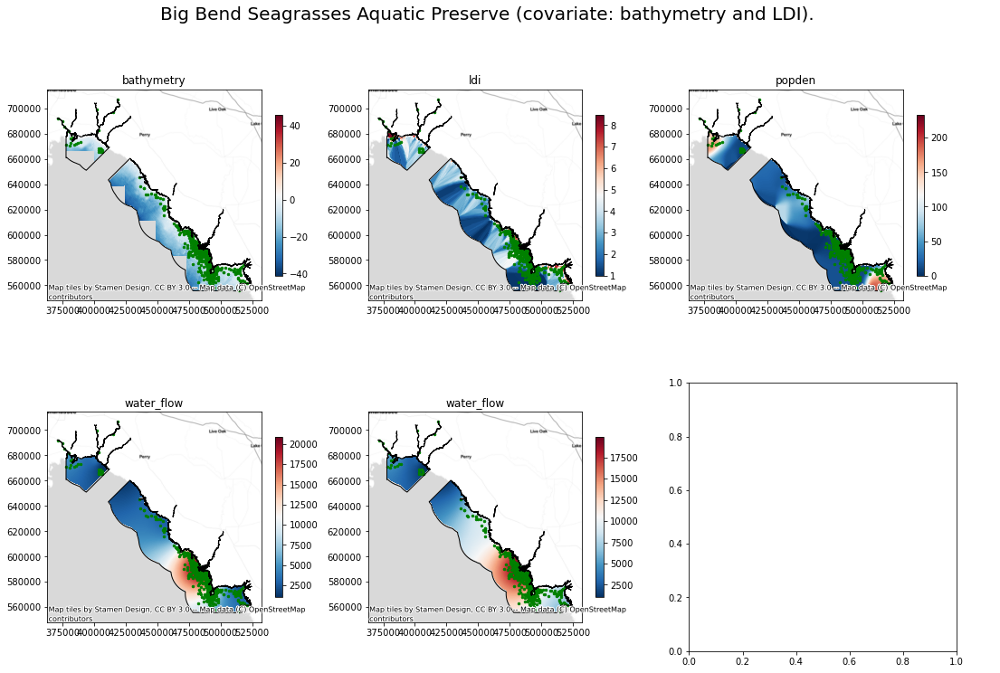

In [61]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [62]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 64.1287169456482 seconds ---
Start the interpolation with the RK method
--- Time lapse: 63.92027449607849 seconds ---


Plot interpolation results

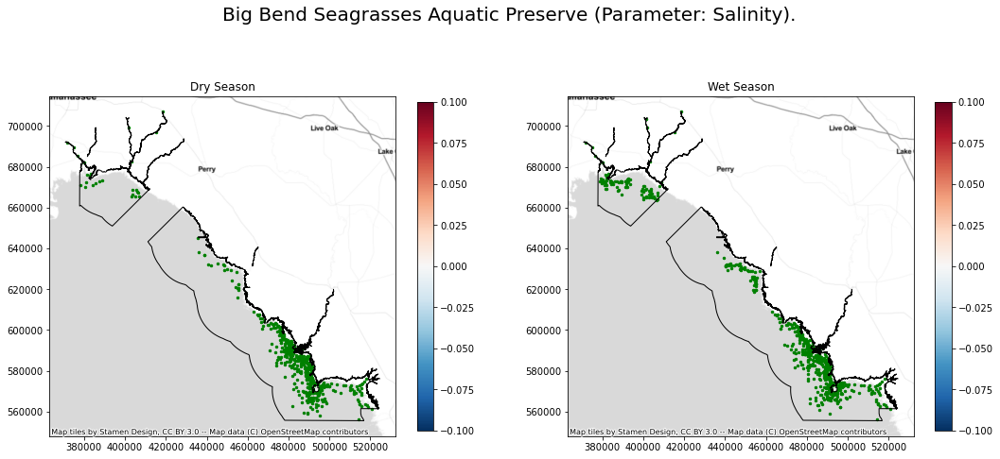

In [63]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.3.9 Validation Summary <a class="anchor" id="s_val_sum"></a>

In [64]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0621,-0.0192,3.9707
RK,-0.1005,-0.0286,3.9735
RK,-0.1030,-0.0286,4.0400
RK,-0.1282,-0.0337,3.9694
RK,-0.0964,-0.0257,3.9734
RK,-0.1216,-0.0264,3.9680
RK,-0.0203,0.0023,3.5795
RK,-0.0544,-0.0015,3.5713


In [65]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.0298,0.0079,3.6475
RK,0.0369,0.0115,3.5916
RK,0.0230,0.0066,3.6484
RK,0.0188,0.0032,3.6421
RK,0.0008,0.0038,3.5768
RK,-0.0431,-0.0046,3.5543
RK,-0.0203,0.0023,3.5795
RK,-0.0559,0.0022,3.5695


## 3.4 Interpolation of Total Nitrogen <a class="anchor" id="tn"></a>

Select data

In [66]:
# Set variables of the program
Para = 'Total Nitrogen'
Para_ab = "TN"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\972659159.py:11: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\972659159.py:12: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt , driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Preview data

In [67]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [68]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Big Bend Seagrasses Aquatic Preserve')

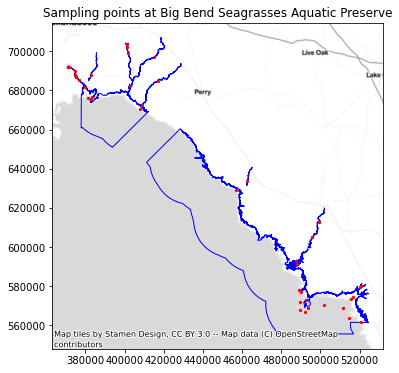

In [69]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.4.1 Regression Kriging of Total Nitrogen (covariate: bathymetry) <a class="anchor" id="tn_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

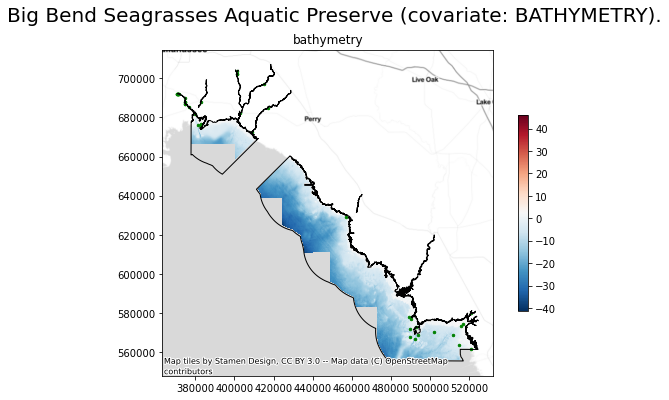

In [70]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [71]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 153.7792706489563 seconds ---
Start the interpolation with the RK method
--- Time lapse: 177.89396452903748 seconds ---


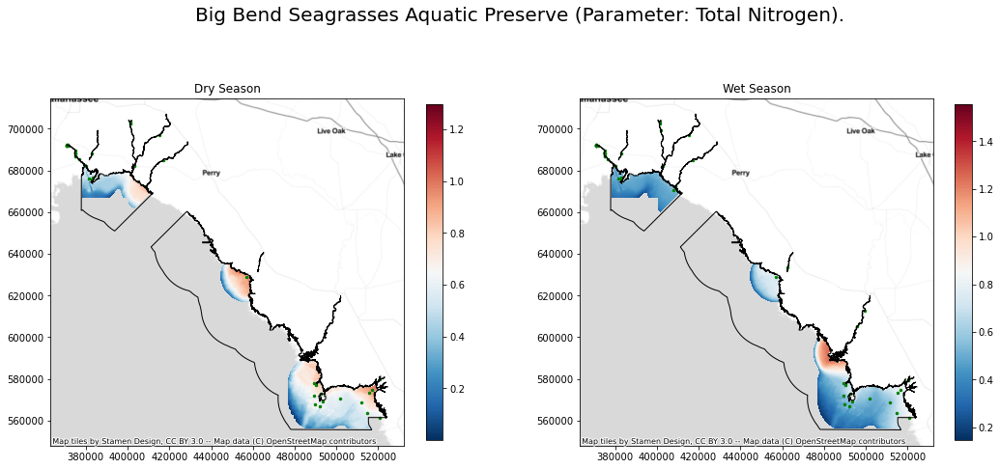

In [72]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.4.2 Regression Kriging (covariate: LDI) <a class="anchor" id="tn_ldi"></a>


RK interpolation

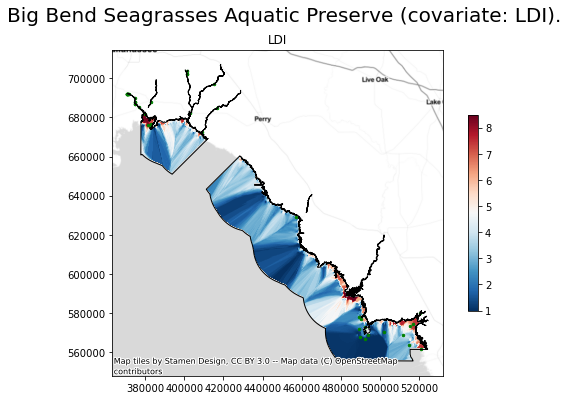

In [73]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [74]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 187.56401538848877 seconds ---
Start the interpolation with the RK method
--- Time lapse: 189.06600379943848 seconds ---


Plot the interpolation result

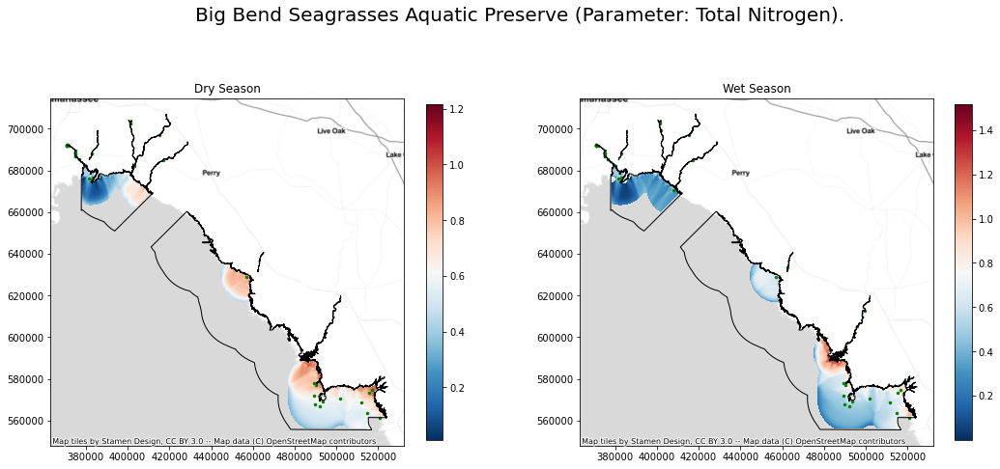

In [75]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.4.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="tn_pd"></a>


RK interpolation

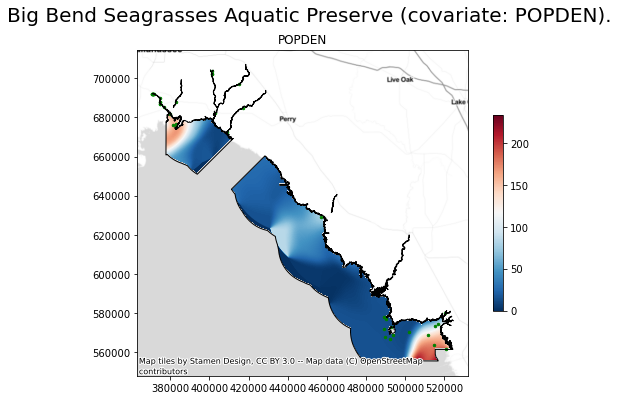

In [76]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [77]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 187.9908754825592 seconds ---
Start the interpolation with the RK method
--- Time lapse: 184.8622109889984 seconds ---


Plot the interpolation result

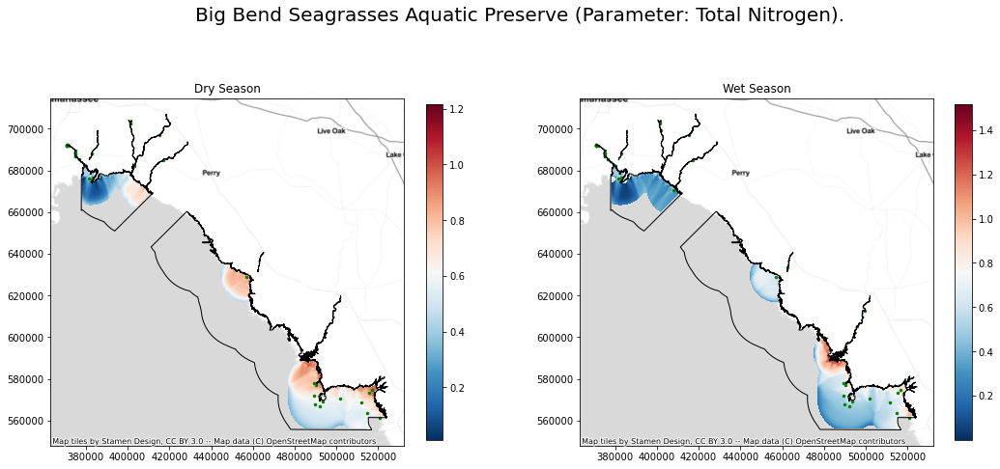

In [78]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.4.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="tn_wf"></a>

RK interpolation

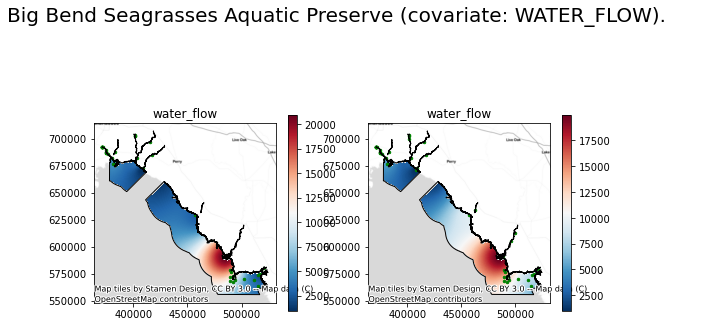

In [79]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [80]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 188.24281525611877 seconds ---
Start the interpolation with the RK method
--- Time lapse: 179.45066618919373 seconds ---


Plot the interpolation result

C:\Users\qiangy\AppData\Local\ESRI\conda\envs\geo3\lib\site-packages\matplotlib\image.py:487: RuntimeWarning: overflow encountered in true_divide
  A_scaled /= ((a_max - a_min) / frac)


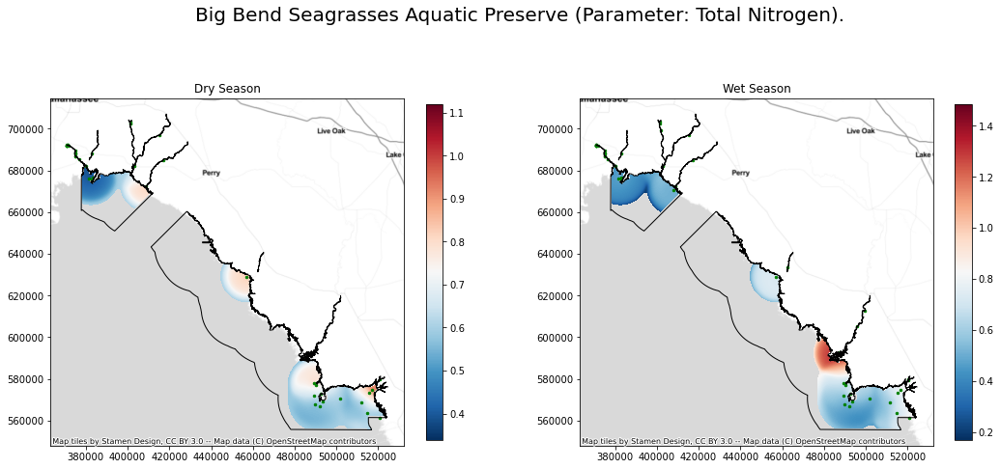

In [81]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.4.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="tn_ldi_bathy"></a>


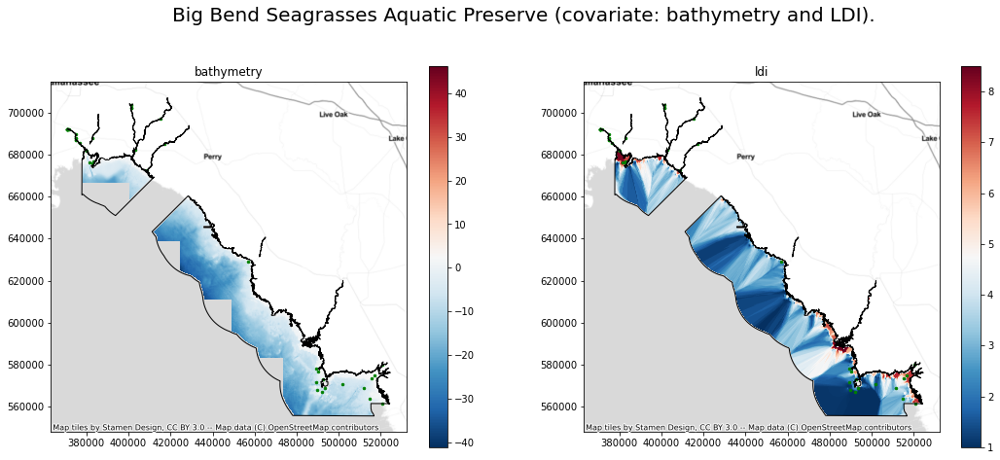

In [82]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [83]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 184.44731855392456 seconds ---
Start the interpolation with the RK method
--- Time lapse: 226.22970271110535 seconds ---


Plot interpolation results

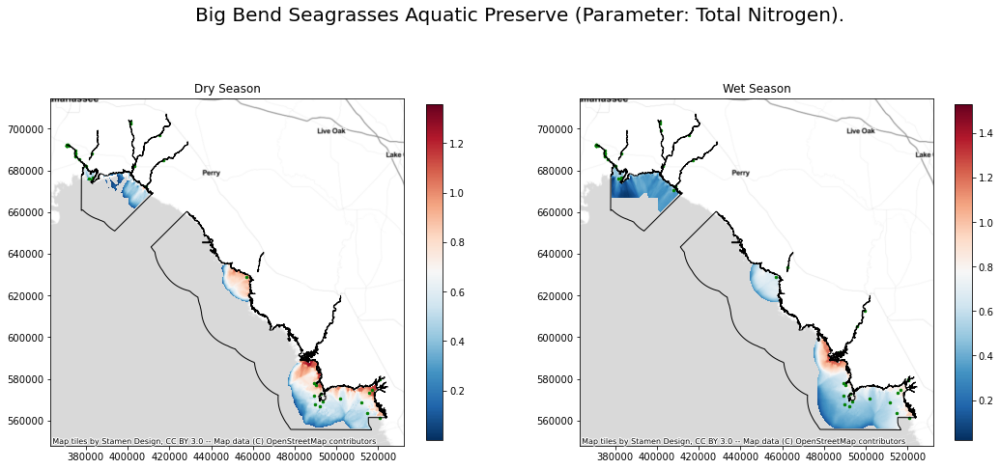

In [84]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.4.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="tn_ldi_bathy_wf"></a>

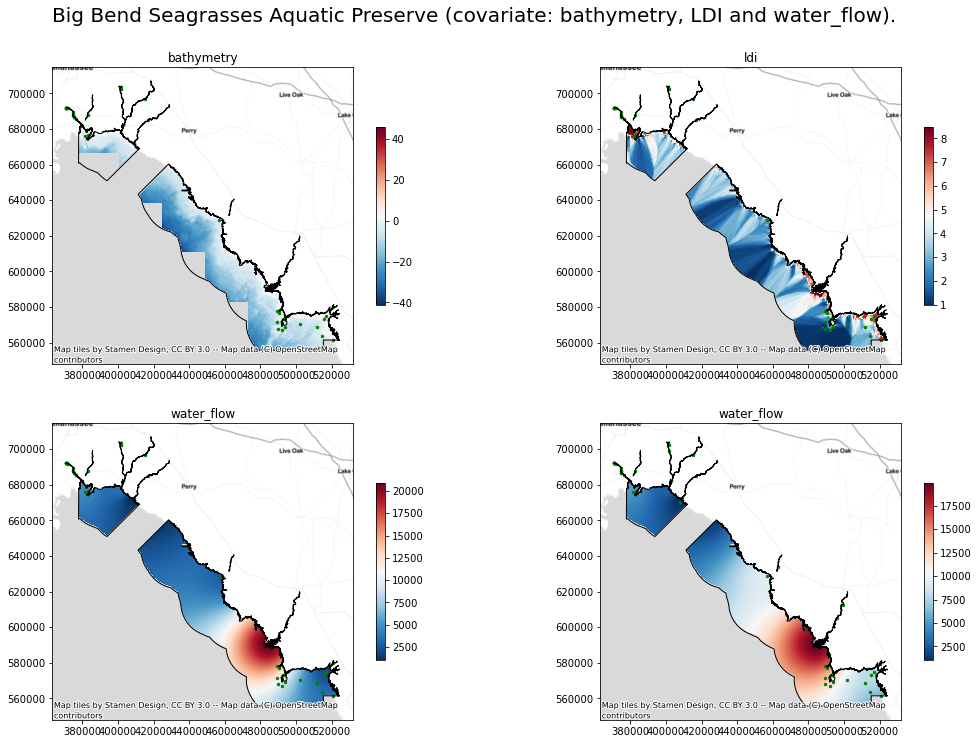

In [85]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [86]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 243.53845477104187 seconds ---
Start the interpolation with the RK method
--- Time lapse: 306.1322567462921 seconds ---


Plot interpolation results

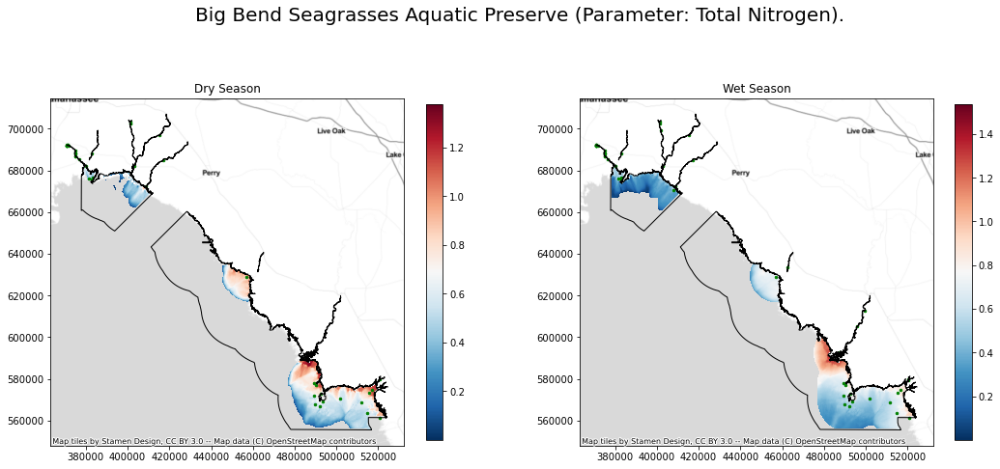

In [87]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.4.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="tn_ldi_bathy_pd"></a>


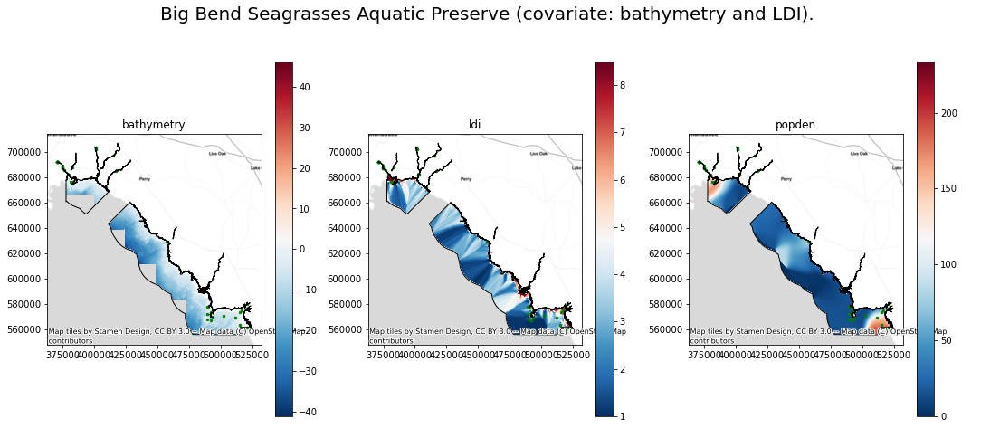

In [88]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [89]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 307.70810294151306 seconds ---
Start the interpolation with the RK method
--- Time lapse: 304.09026741981506 seconds ---


Plot interpolation results

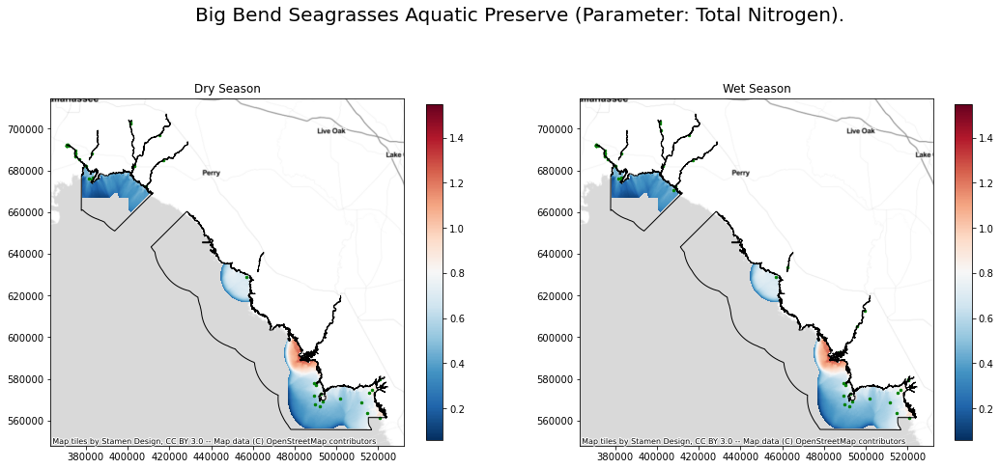

In [90]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.4.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="tn_ldi_bathy_pd_wf"></a>


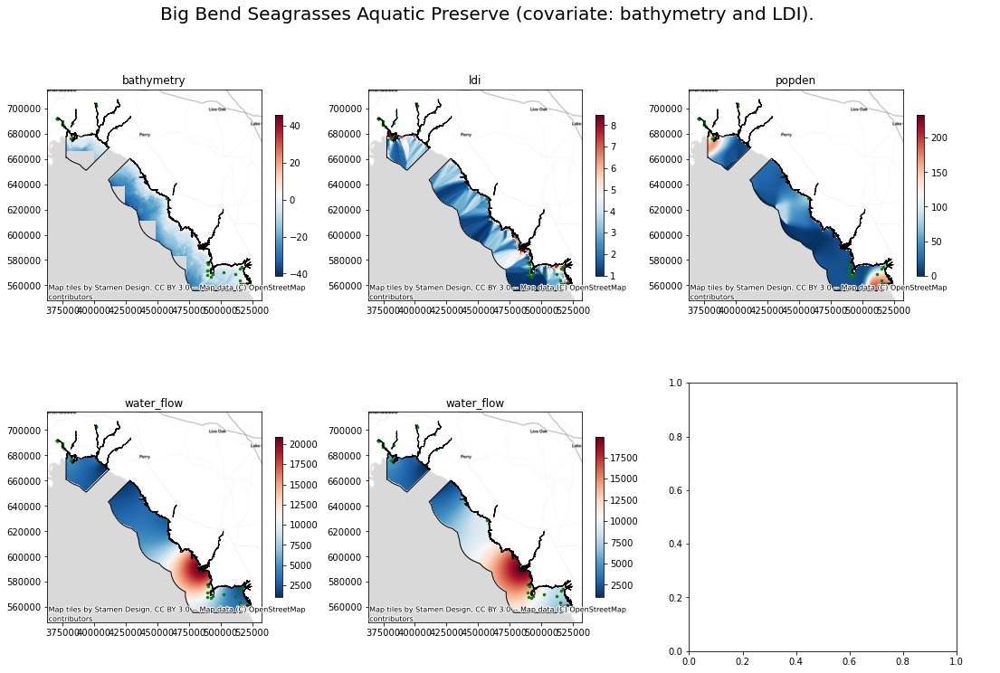

In [91]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [92]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 375.38026332855225 seconds ---
Start the interpolation with the RK method
--- Time lapse: 385.850225687027 seconds ---


Plot interpolation results

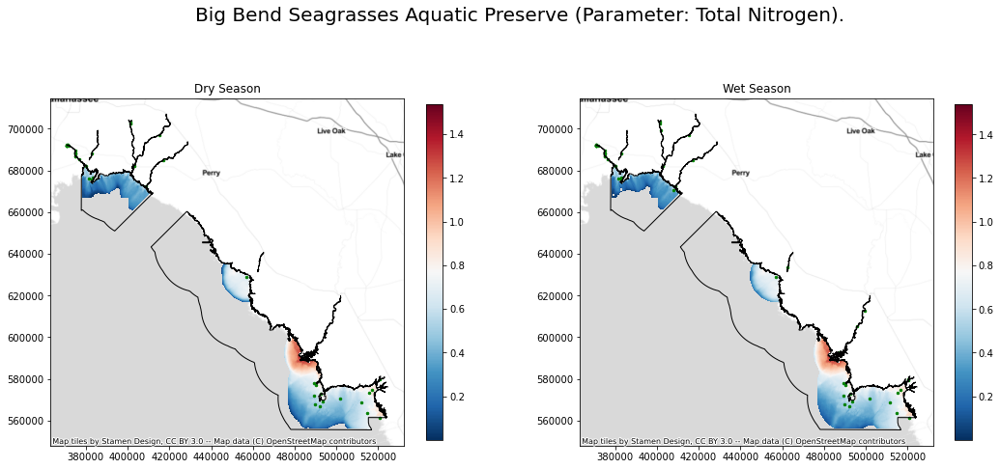

In [93]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.4.9 Validation Summary <a class="anchor" id="tn_val_sum"></a>

In [94]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0442,-0.0908,0.2547
RK,-0.0327,-0.0502,0.2534
RK,-0.0023,0.0089,0.2375
RK,-0.0355,-0.0709,0.2601
RK,-0.0252,-0.0243,0.2311
RK,-0.0239,-0.0096,0.2317
RK,-0.0354,-0.0688,0.2100
RK,-0.0413,-0.0862,0.2200


In [95]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0371,-0.0898,0.2068
RK,-0.0259,-0.0644,0.2024
RK,-0.0380,-0.0948,0.2060
RK,-0.0451,-0.0895,0.2235
RK,-0.0251,-0.0628,0.2084
RK,-0.0348,-0.0604,0.2183
RK,-0.0354,-0.0688,0.2100
RK,-0.0437,-0.0859,0.2212


## 3.5 Interpolation of Turbidity <a class="anchor" id="t"></a>

Select data

In [99]:
Para,Para_ab = 'Turbidity', "T"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\2166963166.py:15: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\2166963166.py:16: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Preview data

In [100]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [101]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Big Bend Seagrasses Aquatic Preserve')

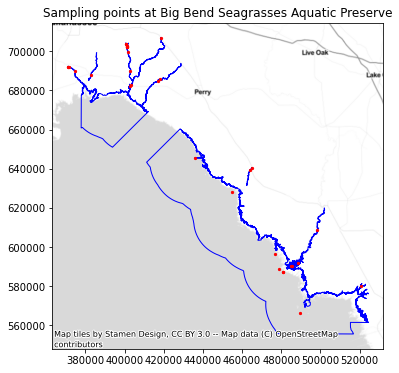

In [102]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.5.1 Regression Kriging of Turbidity (covariate: bathymetry) <a class="anchor" id="t_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

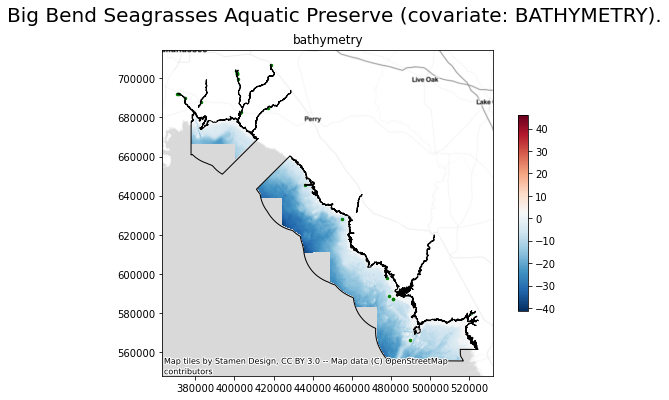

In [103]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [104]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 162.18066787719727 seconds ---
Start the interpolation with the RK method
--- Time lapse: 163.5010266304016 seconds ---


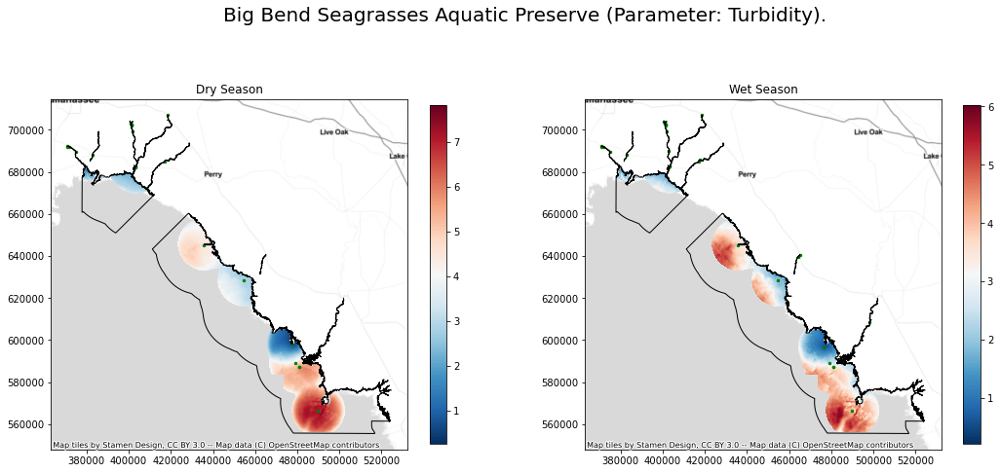

In [105]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.5.2 Regression Kriging (covariate: LDI) <a class="anchor" id="t_ldi"></a>


RK interpolation

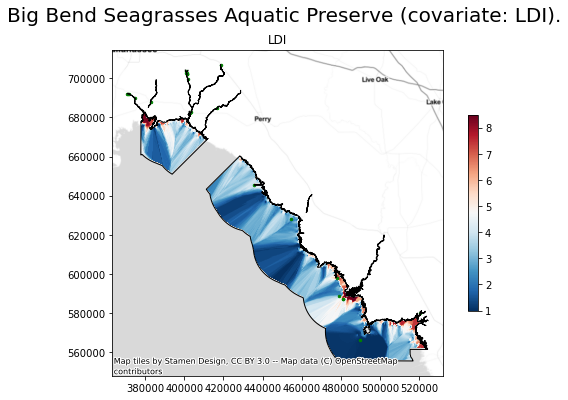

In [106]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [107]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 179.33723425865173 seconds ---
Start the interpolation with the RK method
--- Time lapse: 188.98168277740479 seconds ---


Plot the interpolation result

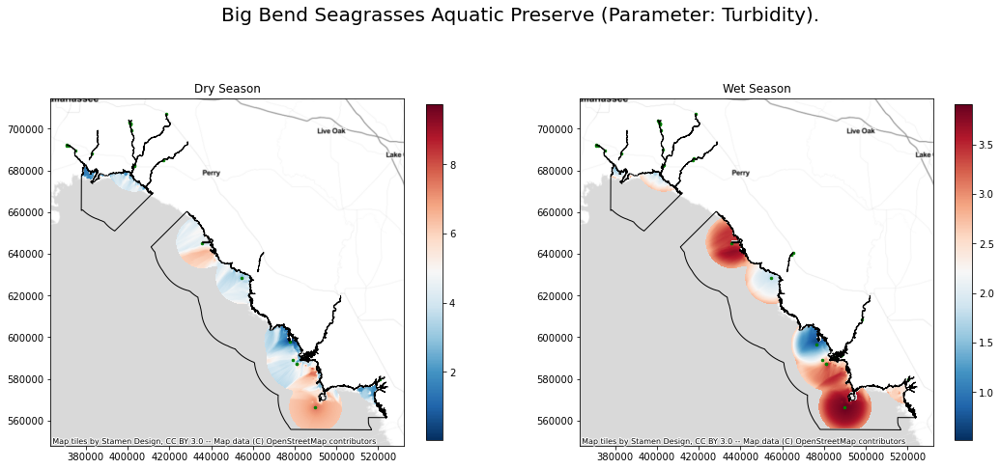

In [108]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="t_pd"></a>


RK interpolation

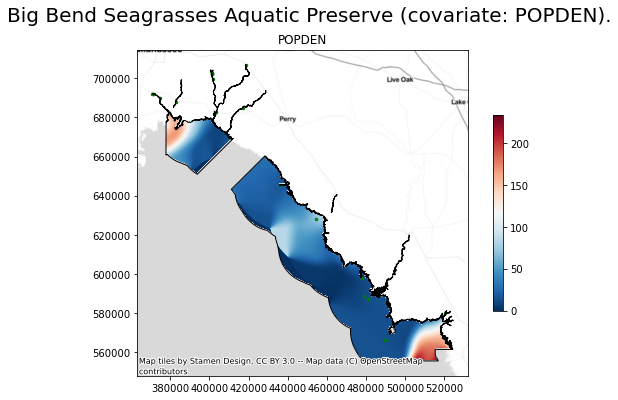

In [109]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [110]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 179.6336579322815 seconds ---
Start the interpolation with the RK method
--- Time lapse: 184.0458984375 seconds ---


Plot the interpolation result

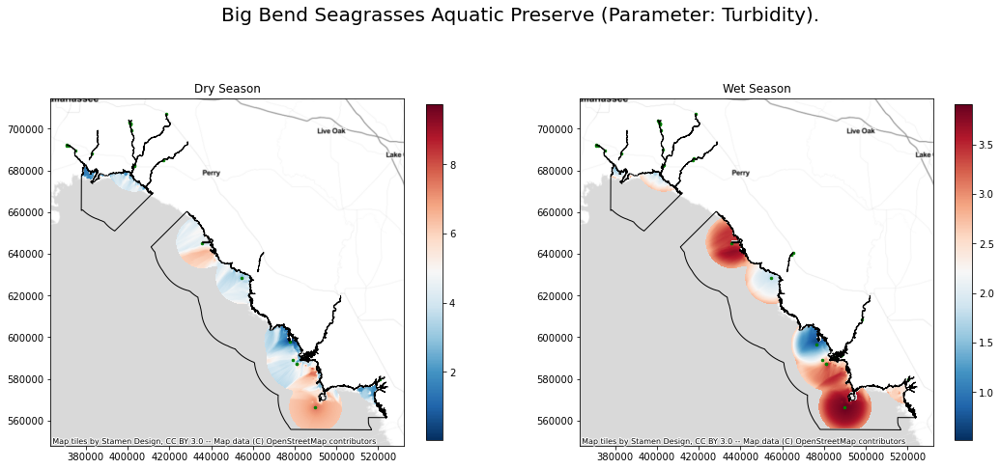

In [111]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="t_wf"></a>

RK interpolation

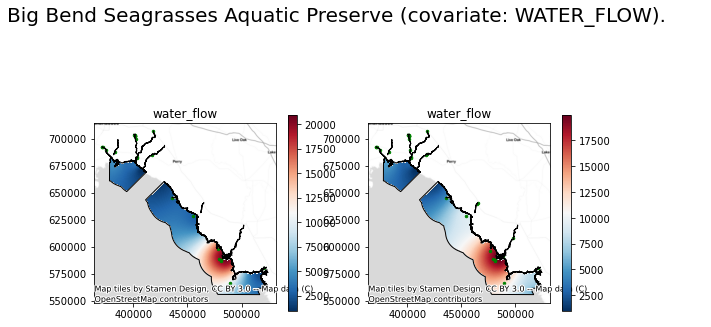

In [112]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [113]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 182.96192288398743 seconds ---
Start the interpolation with the RK method
--- Time lapse: 186.8891727924347 seconds ---


Plot the interpolation result

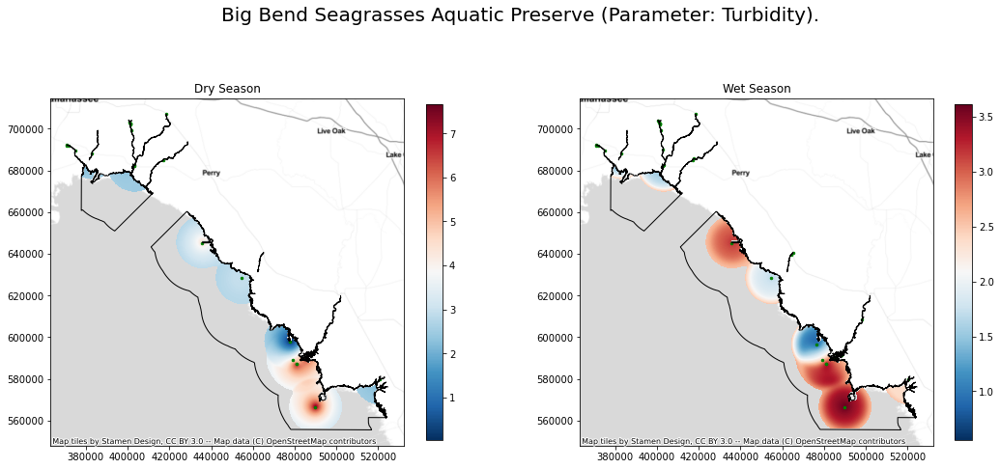

In [114]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.5.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="t_ldi_bathy"></a>


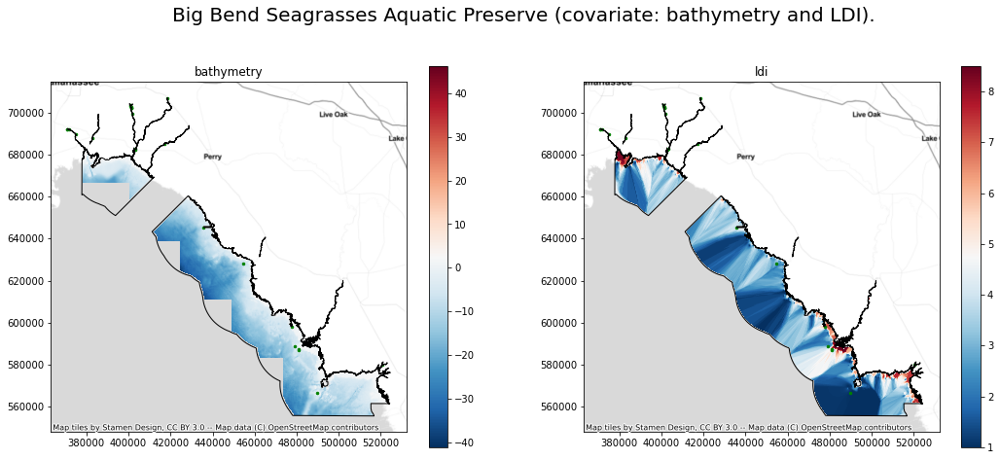

In [115]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [116]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 185.50967693328857 seconds ---
Start the interpolation with the RK method
--- Time lapse: 195.8648500442505 seconds ---


Plot interpolation results

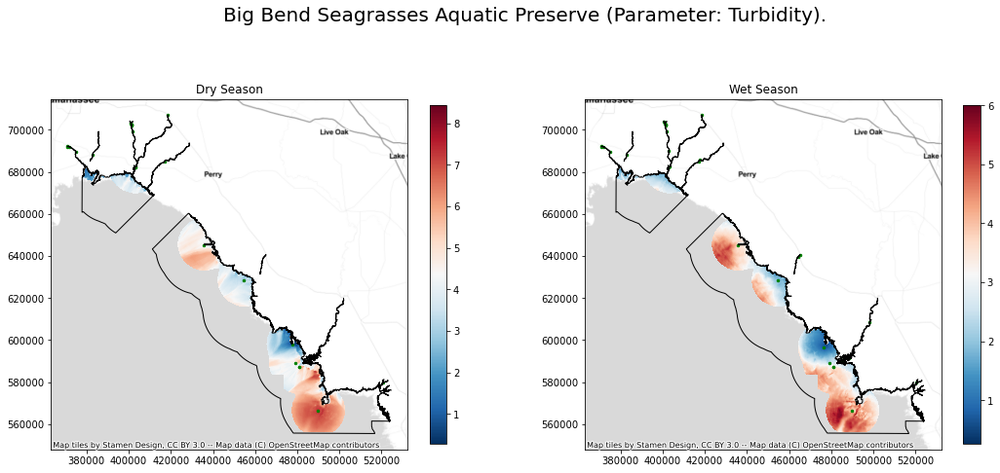

In [117]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.5.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="t_ldi_bathy_wf"></a>

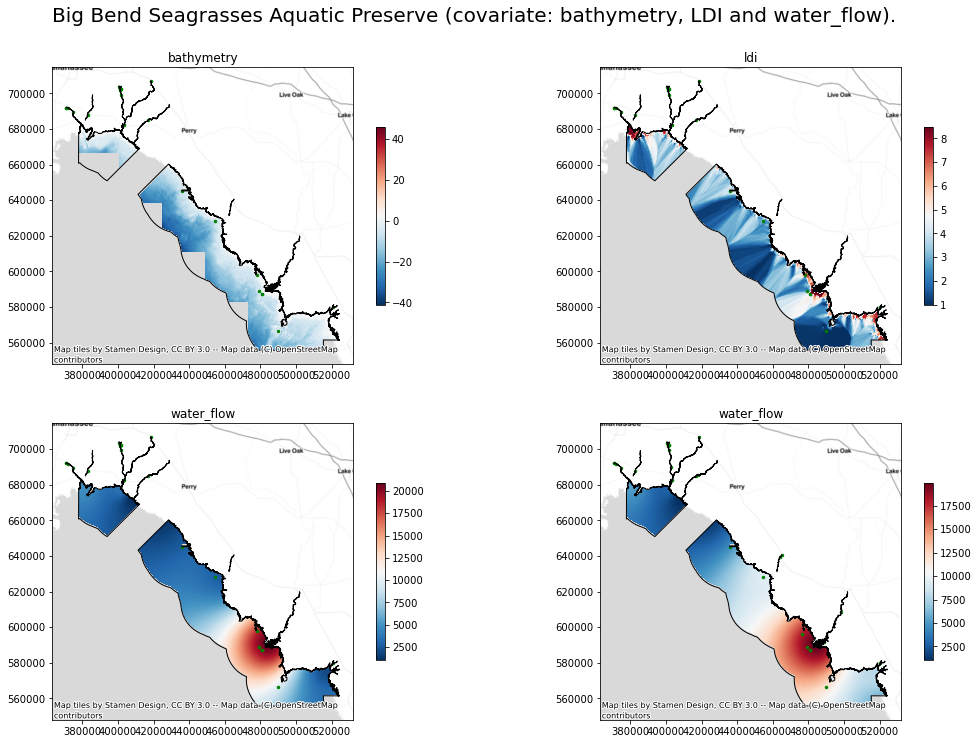

In [118]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [119]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 210.3618221282959 seconds ---
Start the interpolation with the RK method
--- Time lapse: 202.2289788722992 seconds ---


Plot interpolation results

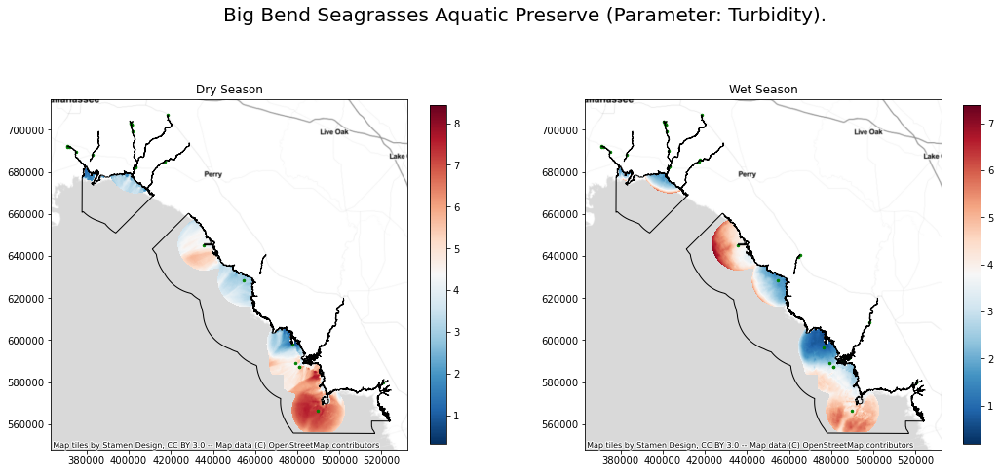

In [120]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.5.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="t_ldi_bathy_pd"></a>


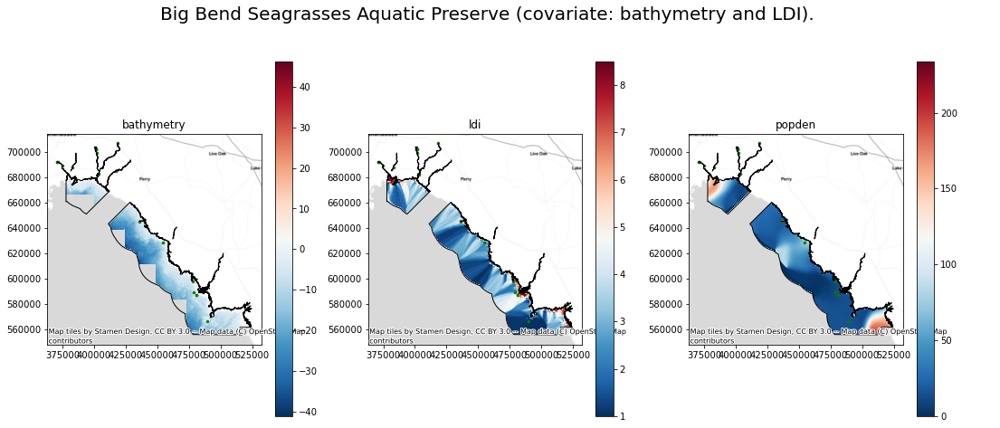

In [121]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [122]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 235.92935872077942 seconds ---
Start the interpolation with the RK method
--- Time lapse: 234.39307284355164 seconds ---


Plot interpolation results

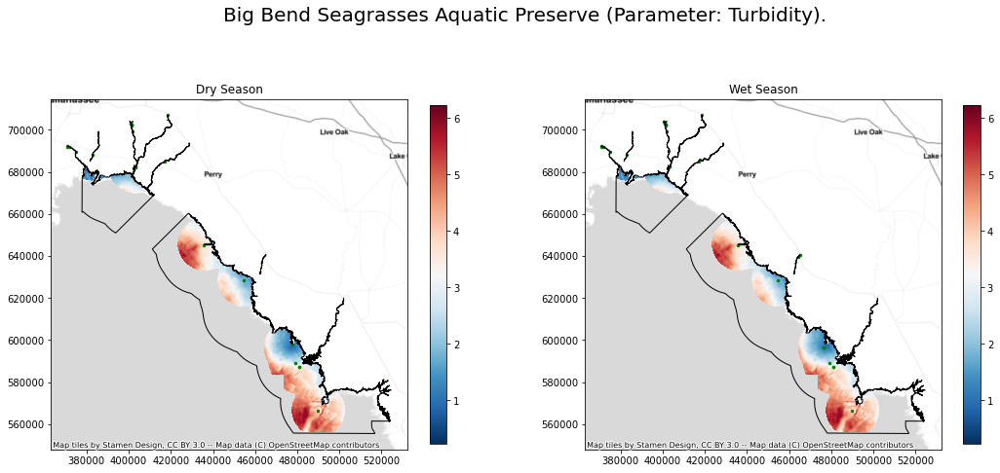

In [123]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.5.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="t_ldi_bathy_pd_wf"></a>


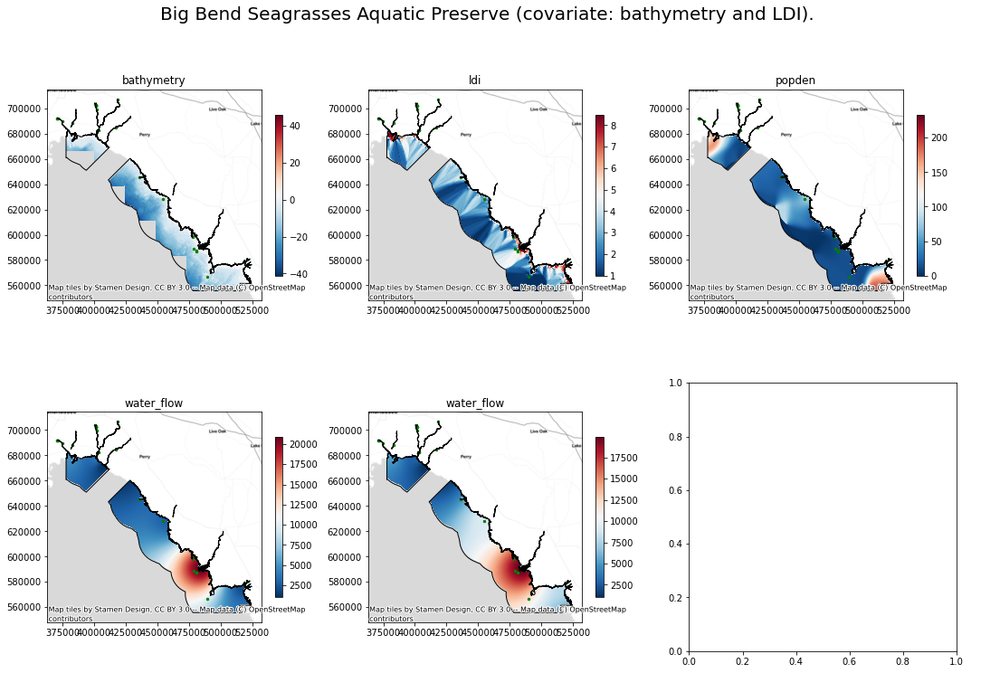

In [124]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [125]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 274.6694121360779 seconds ---
Start the interpolation with the RK method
--- Time lapse: 270.05004048347473 seconds ---


Plot interpolation results

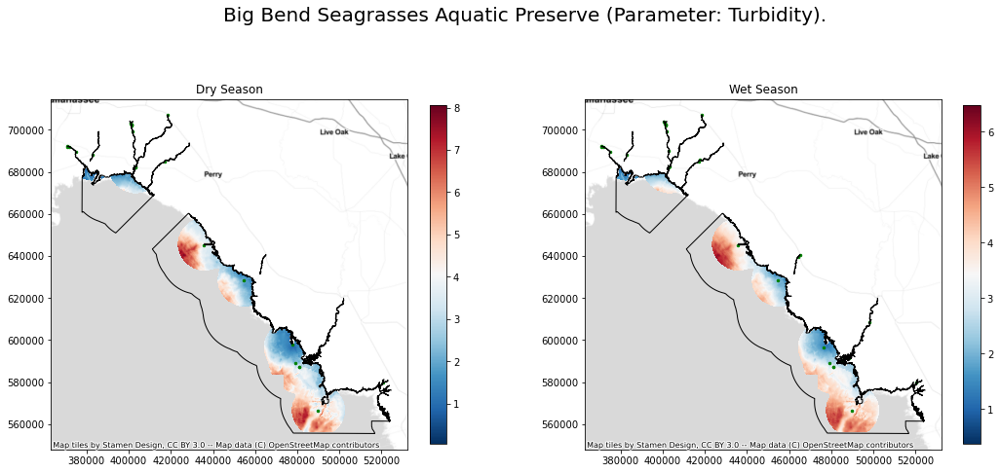

In [126]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.5.9 Validation Summary <a class="anchor" id="t_val_sum"></a>

In [127]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.2595,0.0961,1.6843
RK,-0.0936,-0.1727,1.5231
RK,0.0613,-0.0839,1.4712
RK,0.1191,-0.0315,1.4352
RK,0.0222,-0.0115,1.7452
RK,0.1345,0.0435,1.7225
RK,0.3169,0.0992,1.7055
RK,0.3057,0.1217,1.6270


In [128]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.3179,0.1177,1.6769
RK,0.2411,0.1181,1.4464
RK,0.2556,0.1489,1.4404
RK,0.2687,0.1433,1.4389
RK,0.3234,0.0826,1.7130
RK,0.3049,0.0912,1.7122
RK,0.3169,0.0992,1.7055
RK,0.3125,0.1591,1.6184


## 3.6 Interpolation of Secchi Depth <a class="anchor" id="sd"></a>

Select data

In [129]:
Para,Para_ab = 'Secchi Depth', "SD"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\3165812858.py:15: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\3165812858.py:16: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Preview data

In [130]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [131]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Big Bend Seagrasses Aquatic Preserve')

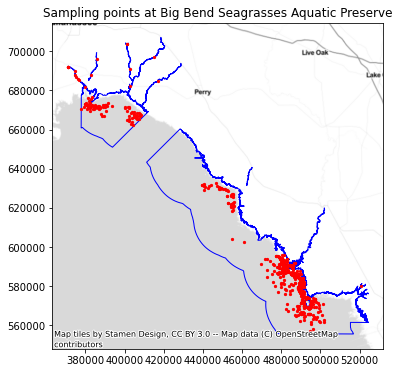

In [132]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.6.1 Regression Kriging of Turbidity (covariate: bathymetry) <a class="anchor" id="sd_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

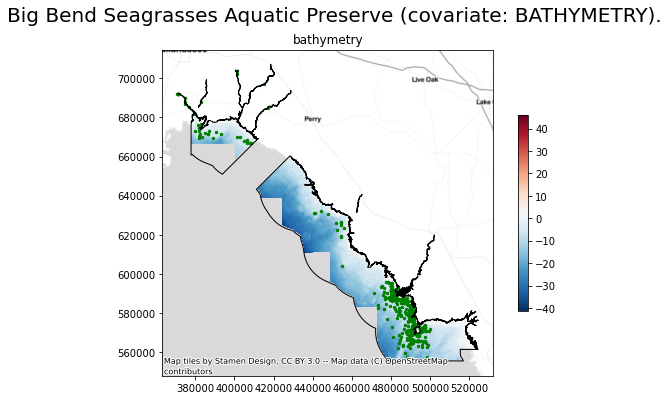

In [133]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [134]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1888.990698337555 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2208.750430583954 seconds ---


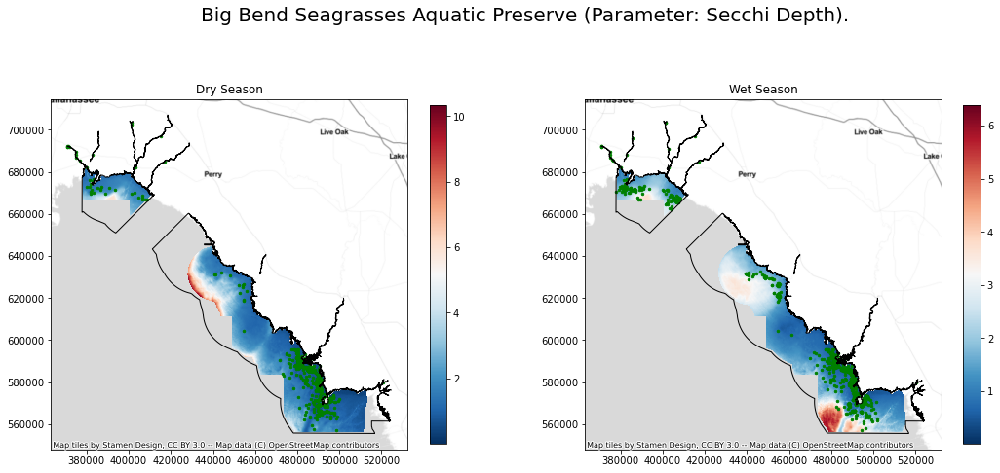

In [135]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.6.2 Regression Kriging (covariate: LDI) <a class="anchor" id="sd_ldi"></a>


RK interpolation

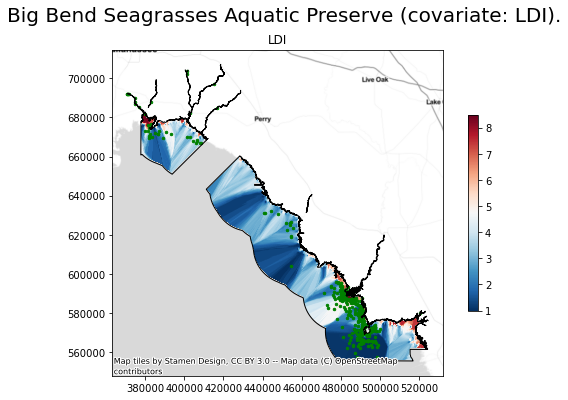

In [136]:
covariate = 'ldi'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [137]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK2, dryRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK2, wetRKStat2 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1976.965487241745 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2139.2748880386353 seconds ---


Plot the interpolation result

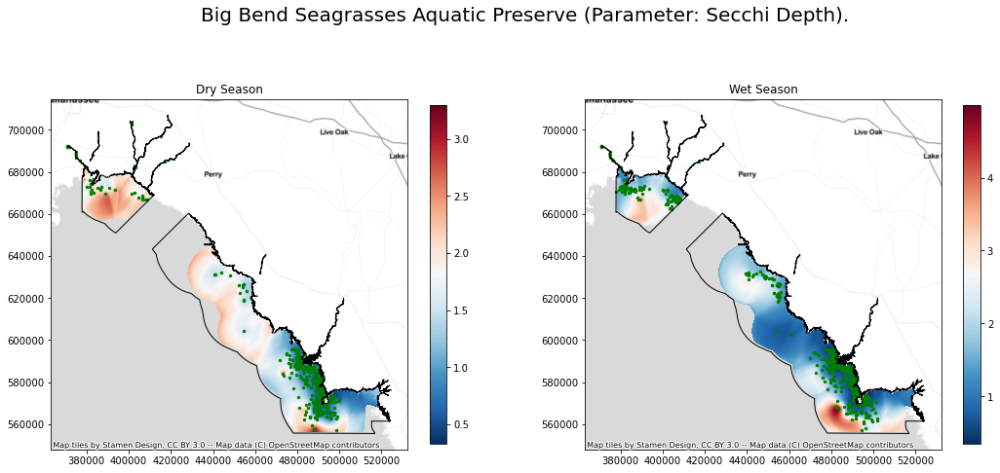

In [138]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="t_pd"></a>


RK interpolation

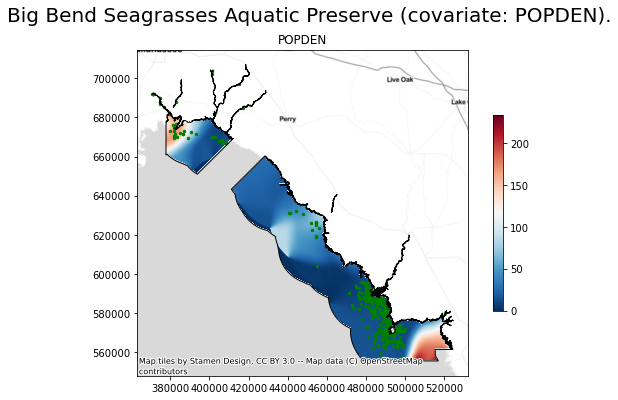

In [139]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [140]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1965.6161863803864 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2093.6549298763275 seconds ---


Plot the interpolation result

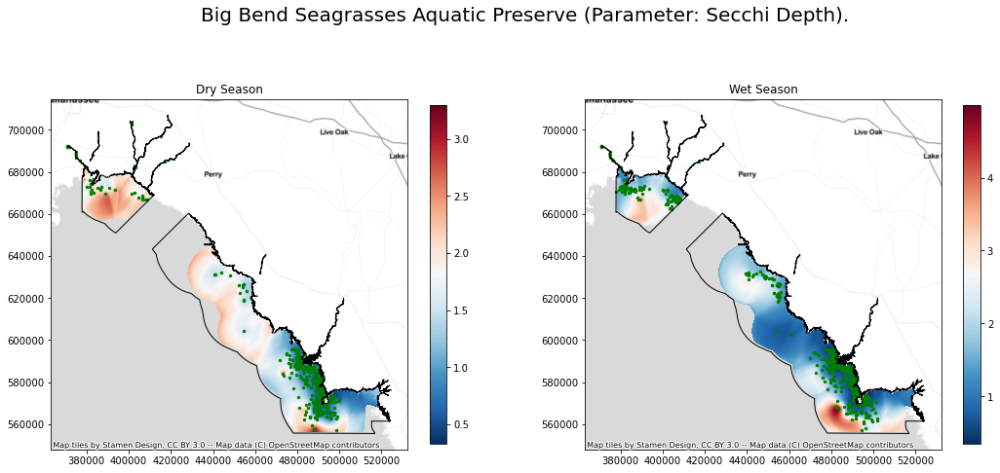

In [141]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.5.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="t_wf"></a>

RK interpolation

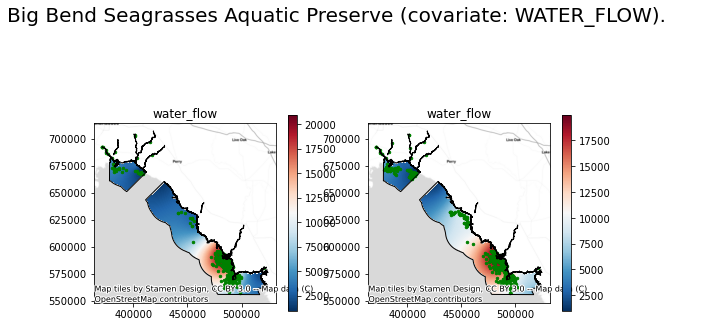

In [142]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [143]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1774.7312152385712 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2217.6677656173706 seconds ---


Plot the interpolation result

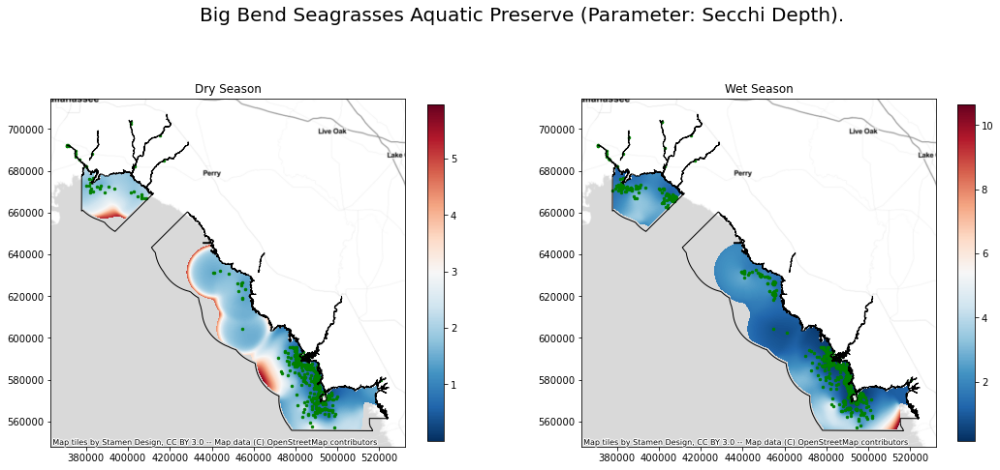

In [144]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.5.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="t_ldi_bathy"></a>


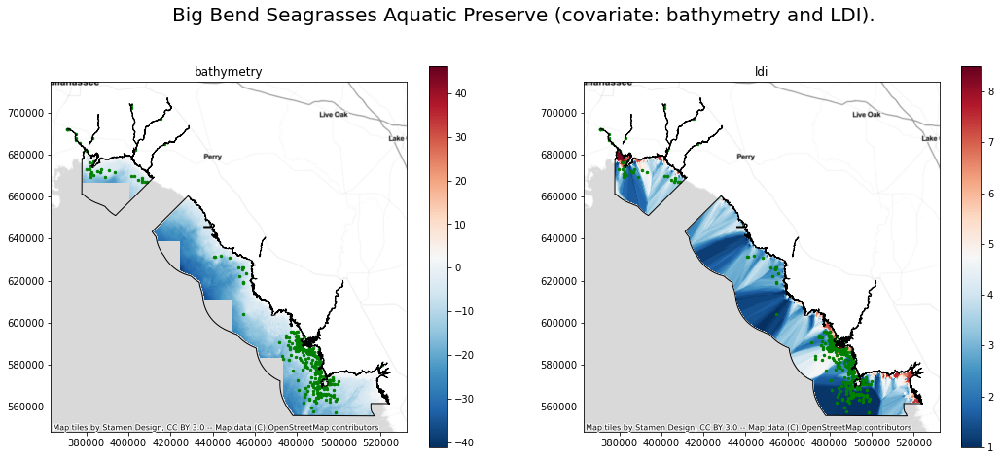

In [145]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [146]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 3213.848382472992 seconds ---
Start the interpolation with the RK method
--- Time lapse: 3857.3734192848206 seconds ---


Plot interpolation results

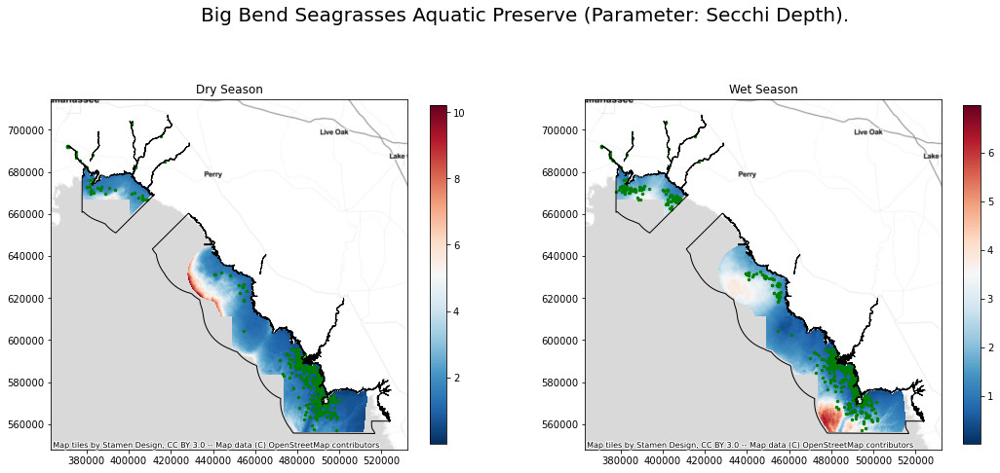

In [147]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.5.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="t_ldi_bathy_wf"></a>

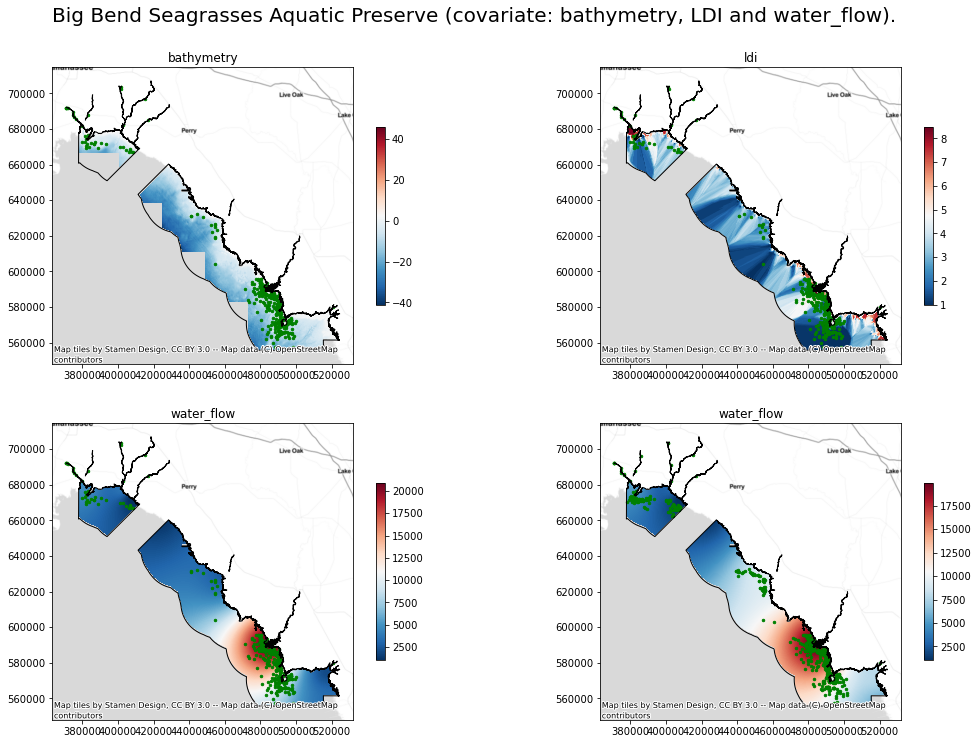

In [148]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [149]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 4685.520406961441 seconds ---
Start the interpolation with the RK method
--- Time lapse: 5243.456252574921 seconds ---


Plot interpolation results

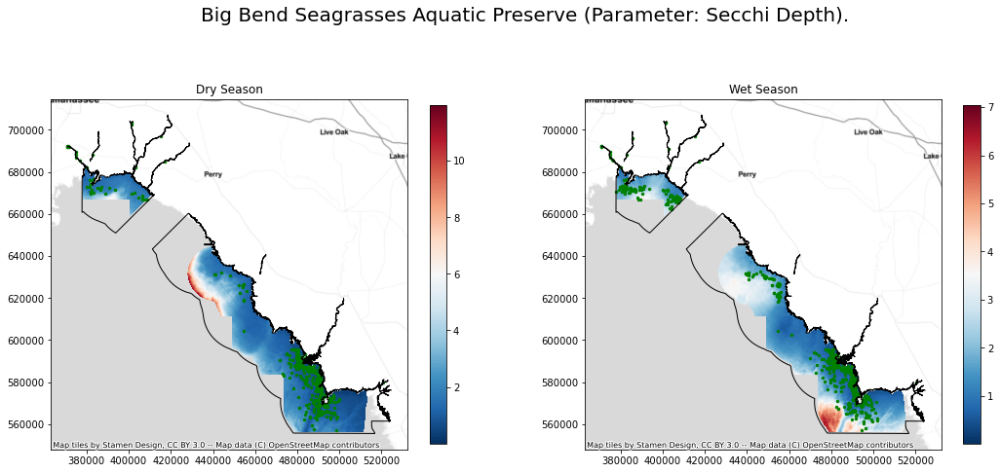

In [150]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.5.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="t_ldi_bathy_pd"></a>


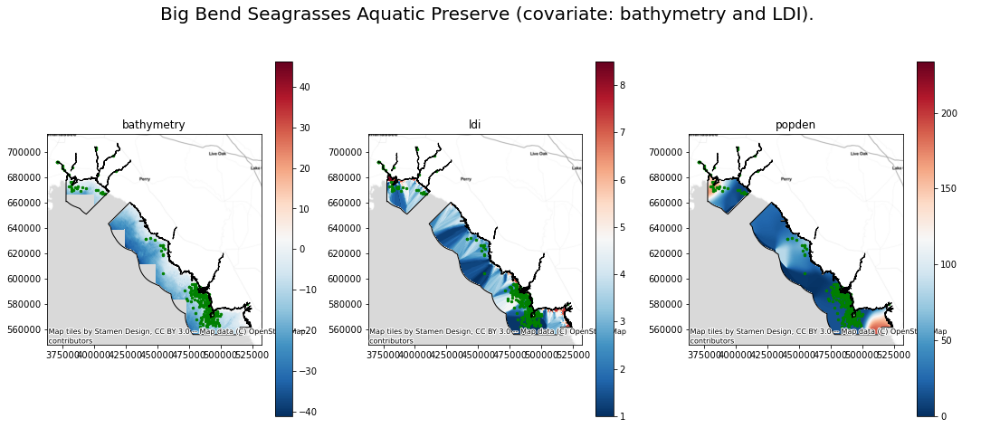

In [151]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [152]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 5252.136225938797 seconds ---
Start the interpolation with the RK method
--- Time lapse: 5176.808394432068 seconds ---


Plot interpolation results

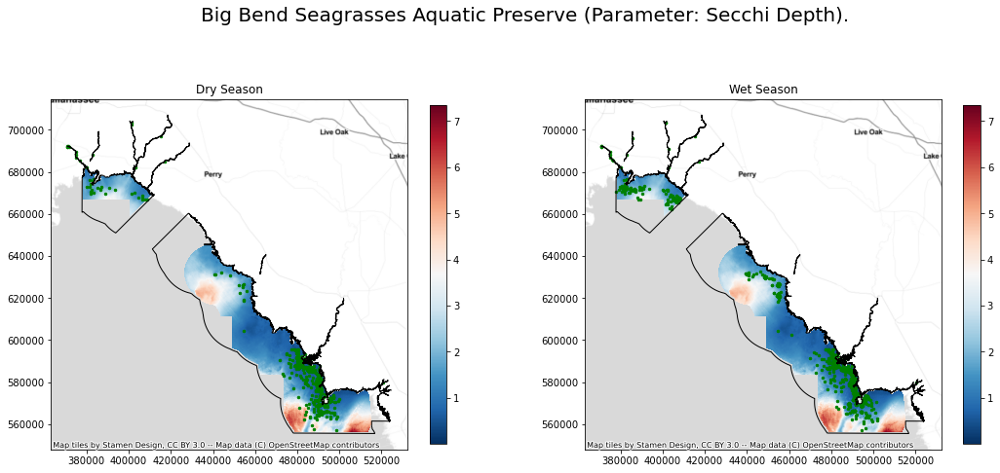

In [153]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.5.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="t_ldi_bathy_pd_wf"></a>


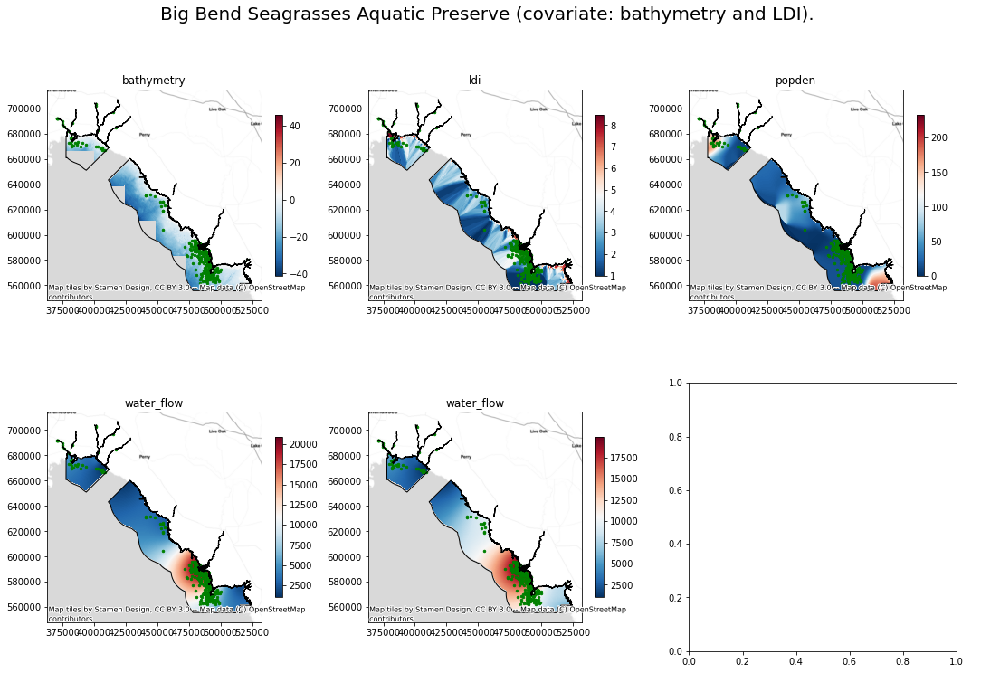

In [154]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [155]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 6649.2286858558655 seconds ---
Start the interpolation with the RK method
--- Time lapse: 6761.336446046829 seconds ---


Plot interpolation results

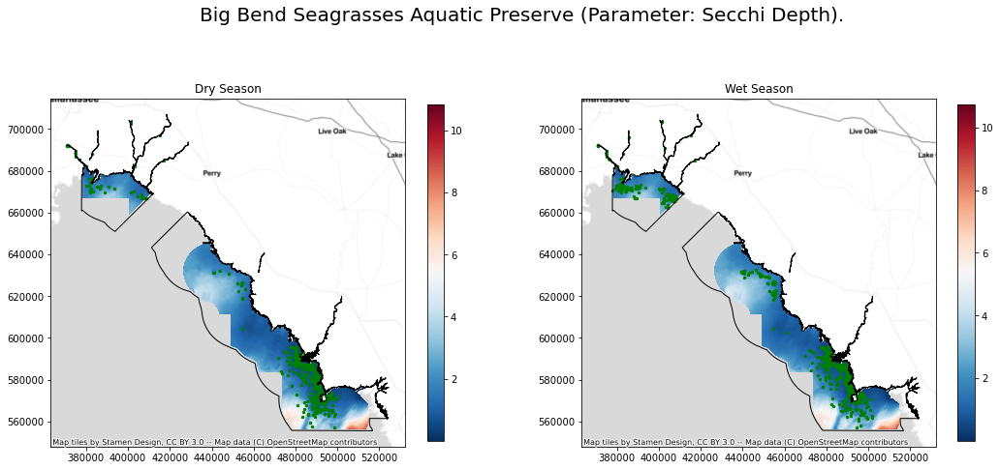

In [156]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.5.9 Validation Summary <a class="anchor" id="t_val_sum"></a>

In [157]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,0.0003,0.0138,0.5468
RK,0.0146,0.0008,0.7131
RK,0.0174,0.0014,0.7021
RK,0.0410,-0.0035,0.8015
RK,-0.0015,0.0080,0.5463
RK,-0.0021,-0.0012,0.5446
RK,-0.0041,0.0013,0.4988
RK,0.0005,0.0065,0.5030


In [158]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0040,0.0098,0.5004
RK,-0.0051,-0.0089,0.5339
RK,0.0031,0.0062,0.5400
RK,0.0032,0.0059,0.5384
RK,-0.0048,0.0066,0.4969
RK,0.0011,0.0127,0.5028
RK,-0.0041,0.0013,0.4988
RK,0.0011,0.0074,0.5040


## 3.6 Interpolation of Secchi Depth <a class="anchor" id="sd"></a>

Select data

In [159]:
year,Para,Para_ab = "2015", 'Secchi Depth', "SD"

dry_input_pt = gis_path+"Dry"+year+Para_ab+b_name+'.shp'
wet_input_pt = gis_path+"Wet"+year+Para_ab+b_name+'.shp'

dfDryMean, gdfDryAll = misc.preprocess.combine_dis_con_dry(dfDis,dfCon,year)
dfWetMean, gdfWetAll = misc.preprocess.combine_dis_con_wet(dfDis,dfCon,year)

gdfDryAll.to_csv(gis_path+'gdfDryAll{}.csv'.format(year))
gdfWetAll.to_csv(gis_path+'gdfWetAll{}.csv'.format(year))

gdfDrySelect = gdfDryAll[(gdfDryAll["ParameterName"]==Para)&(gdfDryAll["ManagedAreaName"]==Area)]
gdfWetSelect = gdfWetAll[(gdfWetAll["ParameterName"]==Para)&(gdfWetAll["ManagedAreaName"]==Area)]

gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\3778504018.py:15: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfDrySelect.to_crs(int(SpatialRef)).to_file(dry_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)
C:\Users\qiangy\AppData\Local\Temp\ipykernel_36600\3778504018.py:16: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdfWetSelect.to_crs(int(SpatialRef)).to_file(wet_input_pt, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)


Preview data

In [160]:
#MA = gpd.read_file(r"D:\Water_Quailty\ManagedAreas\ORCP_Managed_Areas_Oct2021.shp")
b_name = 'ch'
MA = gpd.read_file(gis_path + r"ORCP_Managed_Areas_Oct2021.shp")
CH = MA[MA['MA_Name']==dictArea2[Area]].to_crs(int(SpatialRef))
CH.to_file(boundary_shp, driver='ESRI Shapefile',crs="EPSG:"+SpatialRef)

Also convert all shapefile to Florida GDL Albers (https://epsg.io/3086)

In [161]:
gdfDryShp = gpd.read_file(dry_input_pt)
gdfWetShp = gpd.read_file(wet_input_pt)
extentShp = gpd.read_file(boundary_shp)
extent = str(extentShp.geometry.total_bounds).replace('[','').replace(']','')

Text(0.5, 1.0, 'Sampling points at Big Bend Seagrasses Aquatic Preserve')

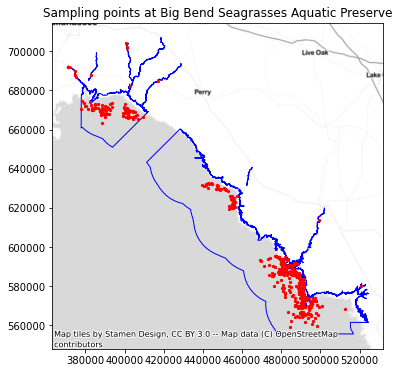

In [162]:
fig, ax = plt.subplots(figsize = (9,6))
extentShp.plot(ax = ax, color='none', edgecolor='blue')
gdfWetShp.plot(ax = ax, marker='o', color='red', markersize=5)
cx.add_basemap(ax = ax,source=cx.providers.Stamen.TonerLite,crs=gdfDryShp.crs)
ax.set_title('Sampling points at {}'.format(Area))

### 3.6.1 Regression Kriging of Secchi Depth (covariate: bathymetry) <a class="anchor" id="sd_bathy"></a>

Run Oridinary Kriging with bathymetry as covariate

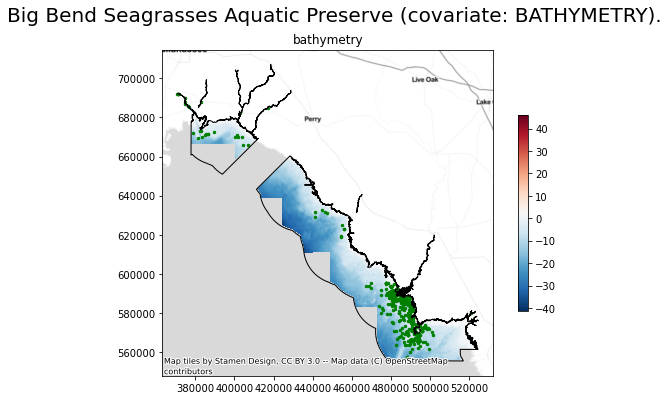

In [163]:
covariate = 'bathymetry'

fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax, fig)

RK interpolation

In [164]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK1, dryRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK1, wetRKStat1 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 2038.0876336097717 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2660.1551337242126 seconds ---


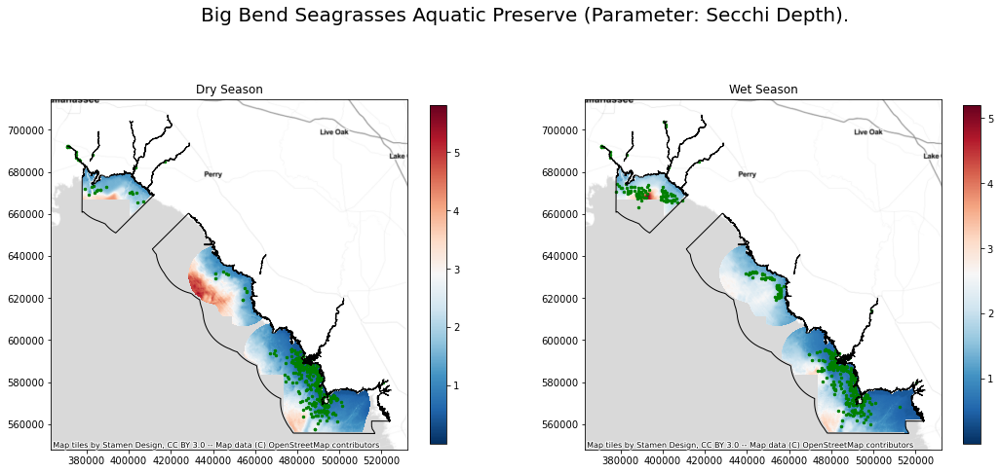

In [165]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK1, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK1, 'Wet Season', axes[1],fig)


### 3.6.3 Regression Kriging (covariate: Population Density) <a class="anchor" id="sd_pd"></a>


RK interpolation

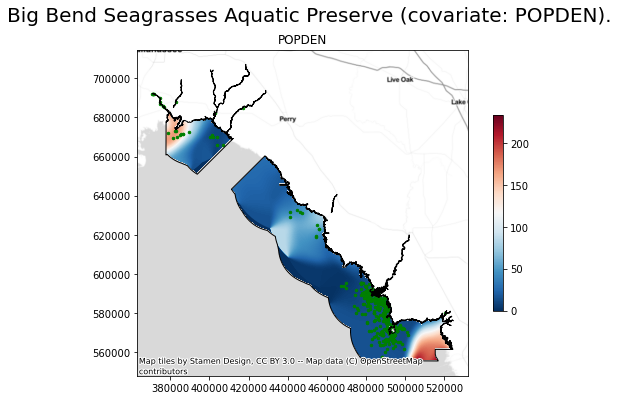

In [166]:
covariate = 'popden'
fig, ax = plt.subplots(1, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname , covariate.upper(), ax, fig)

In [167]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])
in_explanatory_rasters = gis_path + "covariates/{}/{}.tif".format(covariate, dictArea[Area])

dryRK3, dryRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

wetRK3, wetRKStat3 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1900.2364461421967 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2758.6328053474426 seconds ---


Plot the interpolation result

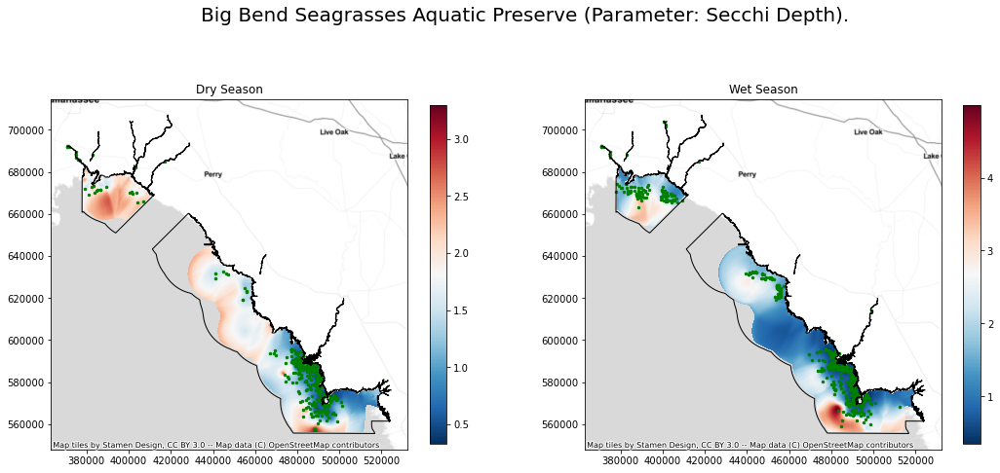

In [168]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK2, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK2, 'Wet Season', axes[1], fig)

### 3.6.4 Regression Kriging (covariate: Water Flow) <a class="anchor" id="sd_wf"></a>

RK interpolation

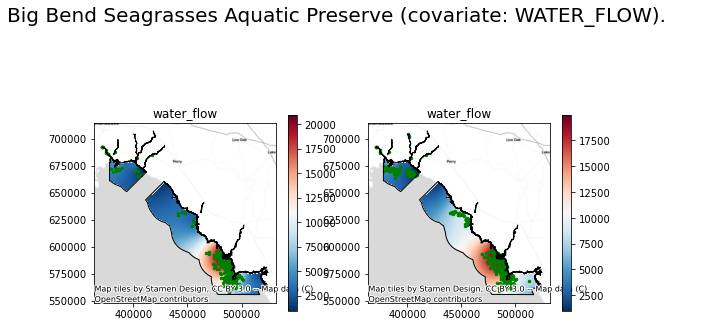

In [169]:
covariate = 'water_flow'
fig, ax = plt.subplots(1,2, figsize=(9, 6))
fig.suptitle("{} (covariate: {}).".format(Area, covariate.upper()),fontsize=20)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate, ax[0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate, ax[1], fig)

In [170]:
season, method, value_field, mask = 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)

in_features = dry_input_pt
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
dryRK4, dryRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:5])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate[0:5])

in_explanatory_rasters = gis_path + "covariates/{}_{}/{}.tif".format(covariate,season.lower(),dictArea[Area])
wetRK4, wetRKStat4 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 1966.9032108783722 seconds ---
Start the interpolation with the RK method
--- Time lapse: 2420.12495970726 seconds ---


Plot the interpolation result

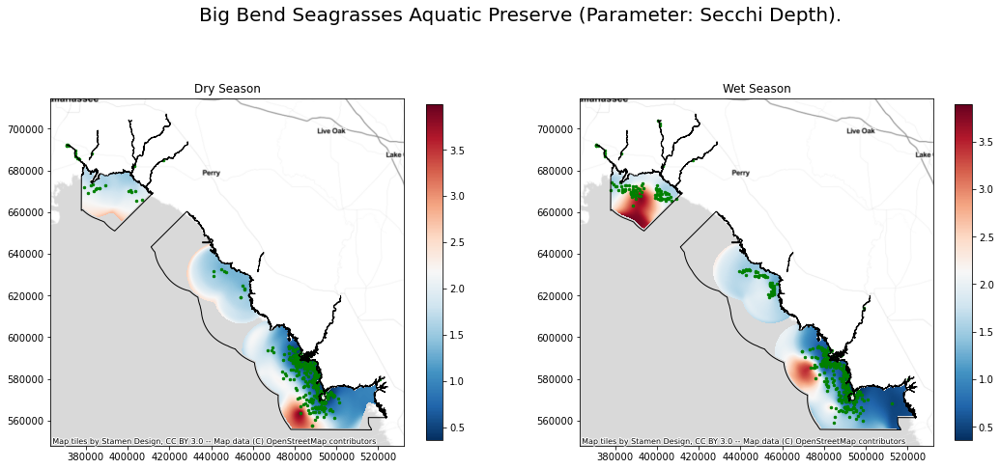

In [171]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK4, 'Dry Season', axes[0], fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK4, 'Wet Season', axes[1], fig)

### 3.6.5 Regression Kriging (covariate: bathymetry + LDI) <a class="anchor" id="sd_ldi_bathy"></a>


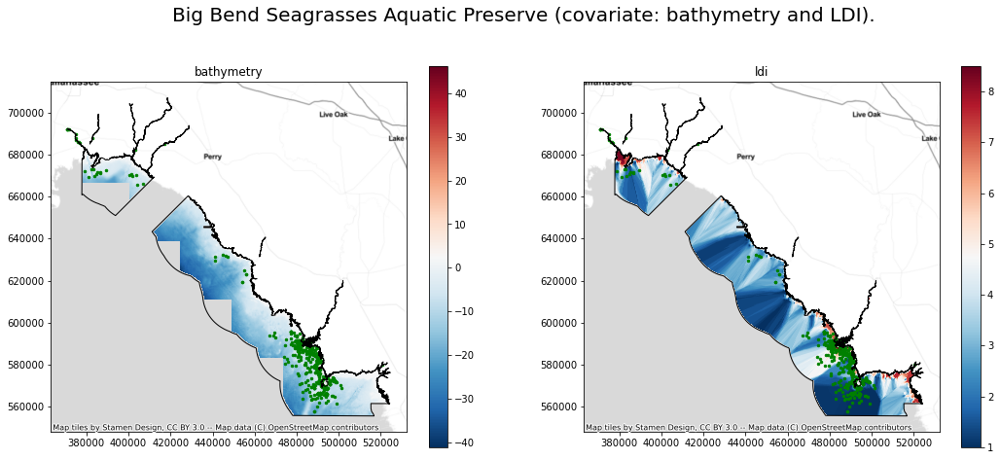

In [172]:
covariate1, covariate2 = 'bathymetry', 'ldi'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

In [173]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]

in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK5, dryRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
in_features = wet_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK5, wetRKStat5 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 3186.1149978637695 seconds ---
Start the interpolation with the RK method
--- Time lapse: 4046.4426069259644 seconds ---


Plot interpolation results

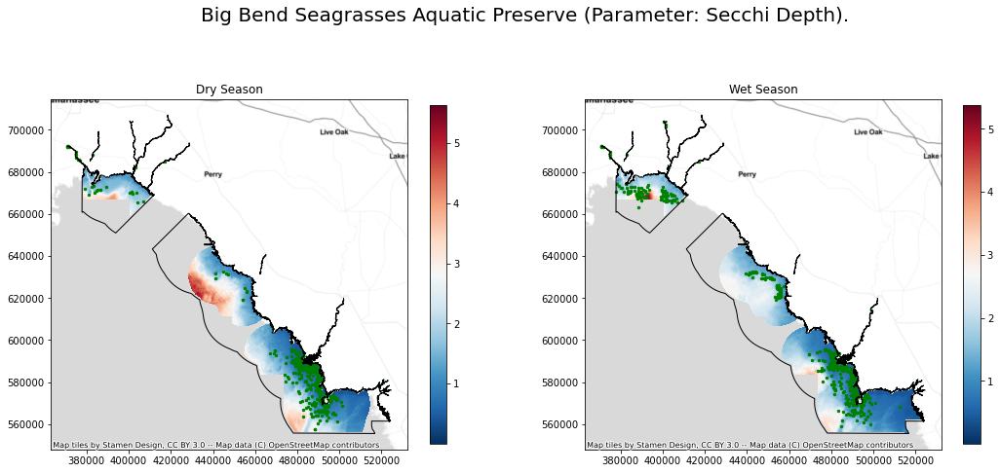

In [174]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK5, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK5, 'Wet Season', axes[1],fig)


### 3.6.6 Regression Kriging (covariate: bathymetry + LDI + Water Flow) <a class="anchor" id="sd_ldi_bathy_wf"></a>

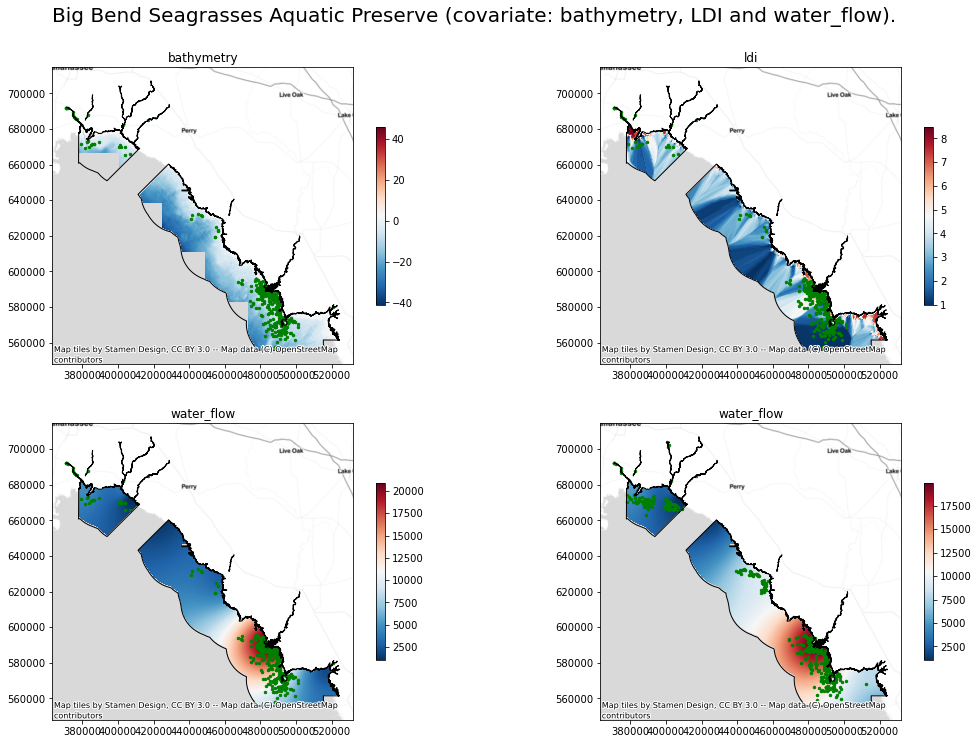

In [175]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,2, figsize=(18, 12))
fig.suptitle("{} (covariate: {}, {} and {}).".format(Area, covariate1, covariate2.upper(), covariate3),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfWetShp,extentShp,ra_fname, covariate3, ax[1,1], fig)

In [176]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])]


in_features = dry_input_pt 
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
dryRK6, dryRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
in_features = wet_input_pt
water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate3,season.lower(),dictArea[Area])
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:2])

wetRK6, wetRKStat6 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 4477.858062505722 seconds ---
Start the interpolation with the RK method
--- Time lapse: 5188.6506559848785 seconds ---


Plot interpolation results

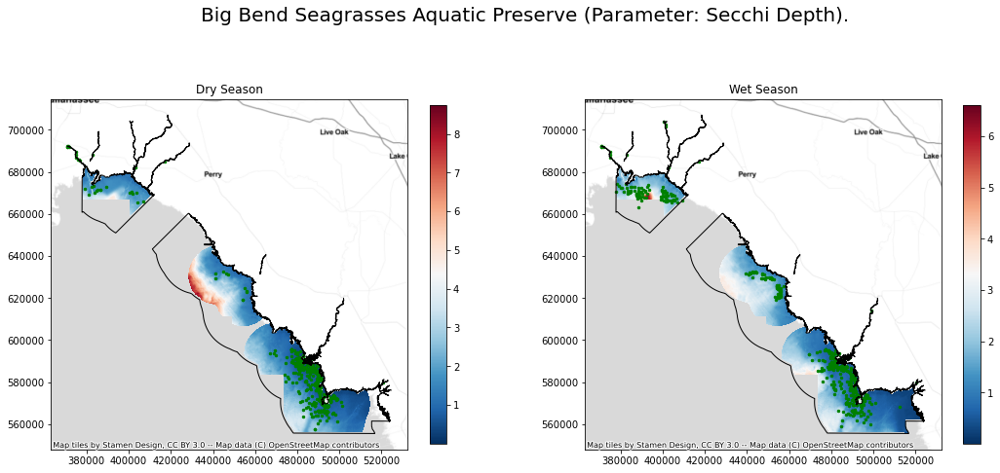

In [177]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK6, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK6, 'Wet Season', axes[1],fig)


### 3.6.7 Regression Kriging (covariate: bathymetry + LDI + PopDen) <a class="anchor" id="sd_ldi_bathy_pd"></a>


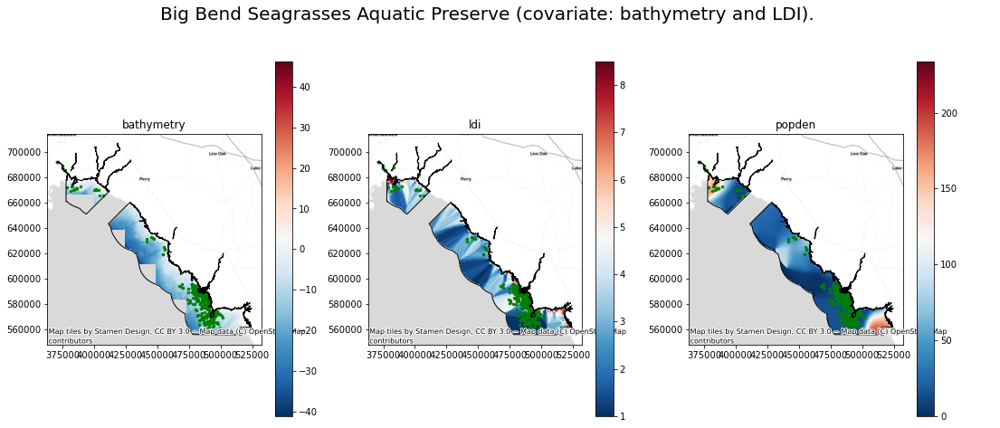

In [178]:
covariate1, covariate2, covariate3 = 'bathymetry', 'ldi', 'popden'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(1,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.8) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[2], fig)

In [179]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

dryRK7, dryRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate[0:1]+'_'+covariate2[0:3])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3])

wetRK7, wetRKStat7 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters)

Start the interpolation with the RK method
--- Time lapse: 5459.871767282486 seconds ---
Start the interpolation with the RK method
--- Time lapse: 5599.844795703888 seconds ---


Plot interpolation results

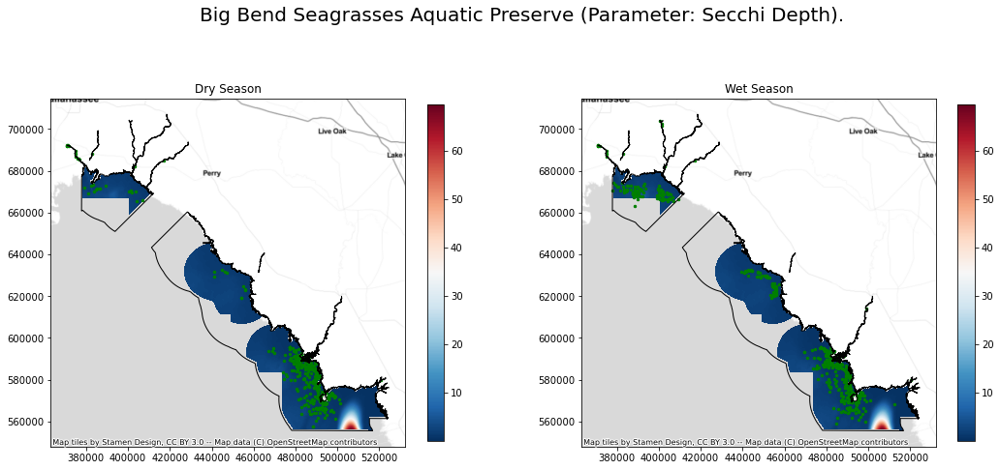

In [180]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK7, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK7, 'Wet Season', axes[1],fig)

### 3.6.8 Regression Kriging (covariate: bathymetry + LDI + PopDen + Water Flow) <a class="anchor" id="sd_ldi_bathy_pd_wf"></a>


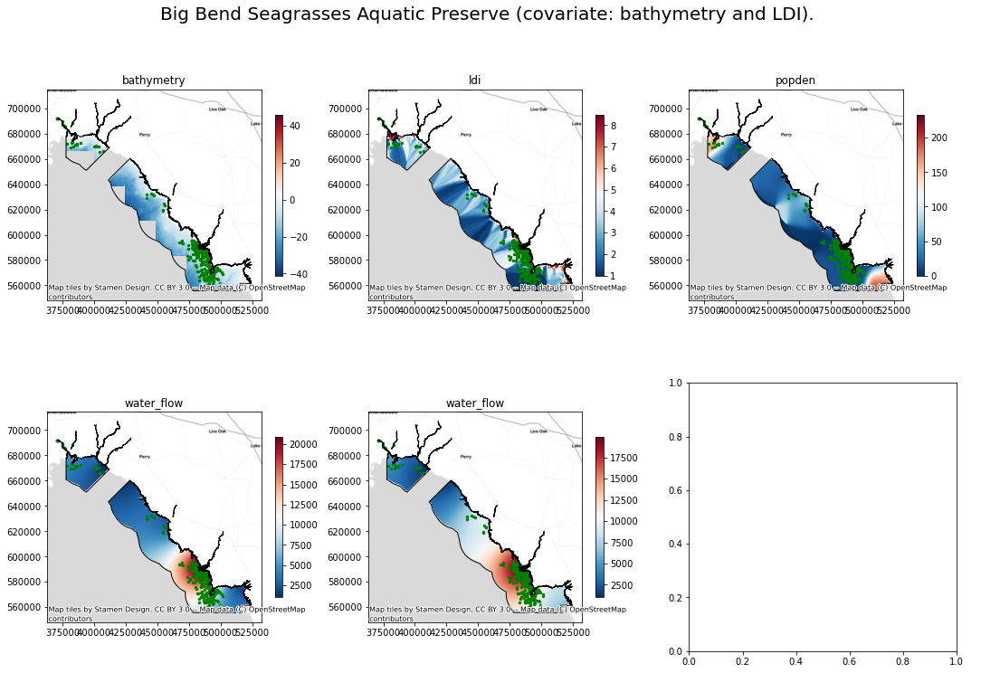

In [181]:
covariate1, covariate2, covariate3, covariate4 = 'bathymetry', 'ldi', 'popden', 'water_flow'

ma_table = pd.read_csv(gis_path + "MA_table.csv")

fig, ax = plt.subplots(2,3, figsize=(18, 12))
fig.suptitle("{} (covariate: {} and {}).".format(Area, covariate1, covariate2.upper()),fontsize=20,y=0.95) 

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate1 ,ax[0,0], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate2, ax[0,1], fig)

ra_fname = gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate3, ax[0,2], fig)

ra_fname = gis_path + "covariates/{}_dry/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,0], fig)

ra_fname = gis_path + "covariates/{}_wet/{}.tif".format(covariate4,dictArea[Area])
misc.interpolation.plot_covariate(Area,gdfDryShp,extentShp,ra_fname, covariate4, ax[1,1], fig)

In [182]:
year, season, method, value_field, mask = '2017', 'Dry','rk','ResultValu', gis_path+ '{}.shp'.format(b_name)
in_explanatory_rasters = [gis_path + "covariates/{}/{}.tif".format(covariate1,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate2,dictArea[Area]),
                          gis_path + "covariates/{}/{}.tif".format(covariate3,dictArea[Area])]

out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
dryRK8, dryRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = value_field, out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

season = 'Wet'
out_ga_layer = gis_path +"{}{}{}_{}.lyrx".format(Para_ab, season.lower(), method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])
out_raster = gis_path +"{}{}{}_{}.tif".format(Para_ab, season.lower(),method.upper(),covariate1[0:1]+'_'+covariate2[0:3]+'_'+covariate3[0:1]+'_'+covariate4[0:1])

water_flow_input = gis_path + "covariates/{}_{}/{}.tif".format(covariate4,season.lower(),dictArea[Area])
wetRK8, wetRKStat8 = misc.interpolation.interpolation(method = method, input_point = in_features, out_raster = out_raster, 
                                              z_field = 'ResultValu', out_ga_layer = out_ga_layer, extent = extent, 
                                              mask = mask, in_explanatory_rasters = in_explanatory_rasters + [water_flow_input])

Start the interpolation with the RK method
--- Time lapse: 6911.17717051506 seconds ---
Start the interpolation with the RK method
--- Time lapse: 6703.1434071063995 seconds ---


Plot interpolation results

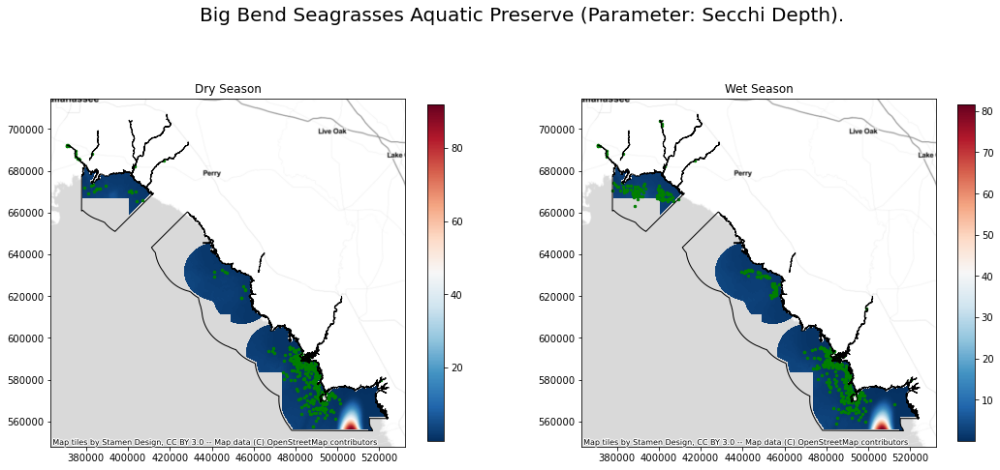

In [183]:
fig, axes = plt.subplots(1,2, figsize=(18, 8))

fig.suptitle("{} (Parameter: {}).".format(Area, Para),fontsize=20)

misc.interpolation.plot_raster(gdfDryShp, extentShp, dryRK8, 'Dry Season', axes[0],fig)
misc.interpolation.plot_raster(gdfWetShp, extentShp, wetRK8, 'Wet Season', axes[1],fig)

### 3.6.9 Validation Summary <a class="anchor" id="sd_val_sum"></a>

In [184]:
sumStatDry1   = pd.concat([dryRKStat1,dryRKStat2,dryRKStat3, dryRKStat4, dryRKStat5,dryRKStat6,dryRKStat7,dryRKStat8])
print("Summary of interpolation assessment in dry season data")
sumStatDry1

Summary of interpolation assessment in dry season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0104,-0.0081,0.3722
RK,0.0146,0.0008,0.7131
RK,-0.0068,-0.0044,0.3964
RK,0.0042,0.0223,0.3958
RK,-0.0082,-0.0018,0.3717
RK,0.0040,0.0224,0.3700
RK,-0.0069,-0.0103,0.4923
RK,-0.0029,-0.0225,0.5120


In [185]:
sumStatWet1   = pd.concat([wetRKStat1,wetRKStat2,wetRKStat3,wetRKStat4, wetRKStat5,wetRKStat6,wetRKStat7,wetRKStat8])
print("Summary of interpolation assessment in wet season data")
sumStatWet1

Summary of interpolation assessment in wet season data


,meanError,meanStandardizedError,rootMeanSquareError
RK,-0.0118,-0.0102,0.4978
RK,-0.0051,-0.0089,0.5339
RK,0.0223,-0.0129,0.6552
RK,-0.0032,-0.0150,0.6379
RK,-0.0111,-0.0113,0.4932
RK,-0.0045,-0.0227,0.5128
RK,-0.0069,-0.0103,0.4923
RK,-0.0139,-0.0245,0.4958
